In [1]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.metrics import root_mean_squared_error
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from helperFunctions import createDataSet, prepare_features_target
import os


In [28]:
year = 2018
file_num = -2
DATA_PATH = f"/Users/nathanhoffman/Library/Mobile Documents/com~apple~CloudDocs/UniBe/3. Semester/Data Driven Diabetes Management/DDDM-Project7/data/Ohio{year}_processed/train"
files = os.listdir(DATA_PATH)
file = files[file_num]
train_set_list, scaler = createDataSet(os.path.join(DATA_PATH, file))
# Remove duplicates
train_set_list = [train_set_list[x] for x, _ in enumerate(train_set_list) if train_set_list[x].equals(train_set_list[x-1]) is False]
train_set = pd.concat(train_set_list)

DATA_PATH = f"/Users/nathanhoffman/Library/Mobile Documents/com~apple~CloudDocs/UniBe/3. Semester/Data Driven Diabetes Management/DDDM-Project7/data/Ohio{year}_processed/test"
files = os.listdir(DATA_PATH)
file = files[file_num]
test_set_list, scaler = createDataSet(os.path.join(DATA_PATH, file), scaler=scaler)
# Remove duplicates
test_set_list = [test_set_list[x] for x, _ in enumerate(test_set_list) if test_set_list[x].equals(test_set_list[x-1]) is False]
test_set = pd.concat(test_set_list)

print(f"Length of train set: {len(train_set_list)}")
print(f"Length of test set: {len(test_set_list)}")
train_set_list

Length of train set: 105
Length of test set: 14


[      cbg  finger  carbInput  bolus  finger_extended  minAfterMeal  mealSize  \
 0   232.0   269.0       60.0    8.2            269.0             0      60.0   
 1   227.0     0.0        0.0    0.0            269.0             5      60.0   
 2   228.0     0.0        0.0    0.0            269.0            10      60.0   
 3   238.0     0.0        0.0    0.0            269.0            15      60.0   
 4   243.0     0.0        0.0    0.0            269.0            20      60.0   
 5   236.0     0.0        0.0    0.0            269.0            25      60.0   
 6   231.0     0.0        0.0    0.0            269.0            30      60.0   
 7   227.0     0.0        0.0    0.0            269.0            35      60.0   
 8   225.0     0.0        0.0    0.0            269.0            40      60.0   
 9   221.0     0.0        0.0    0.0            269.0            45      60.0   
 10  225.0     0.0        0.0    0.0            269.0            50      60.0   
 11  226.0     0.0        0.

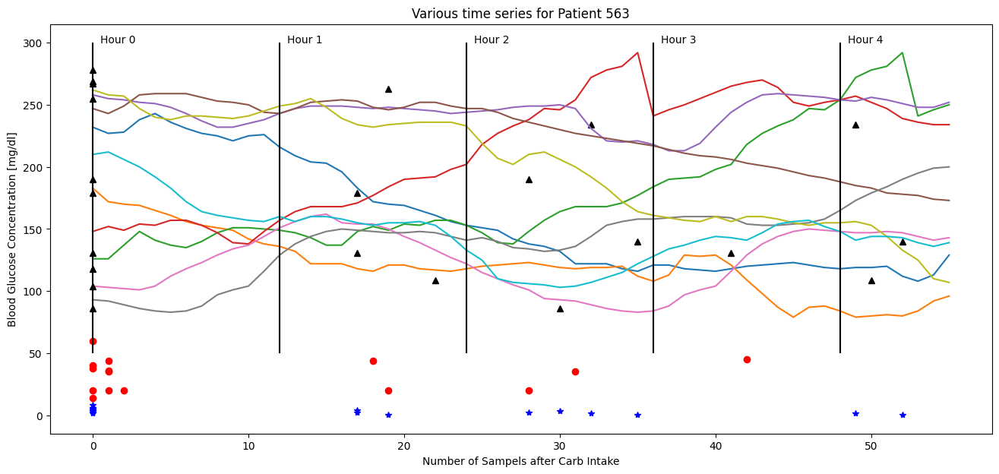

In [36]:
# Check if bolus is larger than carb input
from scipy.stats import linregress
larger_bolus = []
larger_carb = []

data = train_set_list
# for data in train_set_list:
#     if (np.max(data.iloc[0:5].carbInput) > np.max(data.iloc[0:5].bolus)):
#         larger_carb.append(data)
#     else:
#         larger_bolus.append(data)


fig, axes = plt.subplots(1, 1, figsize=(16, 7))
for i, ser in enumerate(data[:10]):
    carbs = ser[ser.carbInput != 0]
    bolus = ser[ser.bolus != 0]
    finger = ser[ser.finger != 0]
    axes.plot(ser.index, ser.cbg )
    axes.plot(carbs.index, carbs.carbInput, "ro")
    axes.plot(bolus.index, bolus.bolus, "b*")
    axes.plot(finger.index, finger.finger, "k^")
    # all_carbs += larger_carb[i].cbg
axes.set_title("Various time series for Patient 563")
axes.set_xlabel("Number of Sampels after Carb Intake")
axes.set_ylabel("Blood Glucose Concentration [mg/dl]")
for i in range (5):
    axes.text(i*12+0.5, 300, f"Hour {i}")
    axes.vlines(i*12, 50, 300, "k")
# mean_carbs = all_carbs/len(larger_carb)
# axes[0].plot(train_set_list[i].index, mean_carbs, 'k--')

# for i in range(len(larger_bolus)):
#     axes[1].plot(larger_bolus[i].index, (larger_bolus[i].cbg))
#     all_bolus += larger_bolus[i].cbg
# mean_bolus = all_bolus/len(larger_bolus)
# axes[1].plot(train_set_list[i].index, mean_bolus, 'k--')

# slope, intercept, r_value, p_value, std_err = linregress(train_set_list[i].index, (mean_carbs))
# print(slope)
# # axes[0].plot(train_set_list[i].index, slope*train_set_list[i].index, 'r-')
# slope, intercept, r_value, p_value, std_err = linregress(train_set_list[i].index, (mean_bolus))
# print(slope)
# axes[1].plot(train_set_list[i].index, slope*train_set_list[i].index, 'r-')

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
all_cbg = 0
for i in range(len(train_set_list)):
    if i < len(train_set_list):
        axes[0].plot(train_set_list[i].index, (train_set_list[i].cbg))
    if i < len(test_set_list):
        axes[1].plot(test_set_list[i].index, test_set_list[i].cbg)
    all_cbg += train_set_list[i].cbg
    
mean_cbg = all_cbg/len(train_set_list)
axes[0].plot(train_set_list[i].index, mean_cbg, 'k--')

NameError: name 'plt' is not defined

In [25]:
def train_model(model, data, i = 0):
    # Seperating X and y
    X = data.drop(["cbg"], axis=1)
    random.seed(42)
    X["glucose_lag_1"]  = X["glucose_lag_1"] * random.uniform(0.75, 1.25)
    X["glucose_lag_2"]  = X["glucose_lag_2"] * random.uniform(0.75, 1.25)
    y_true = data["cbg"]
    
    
    
    # Train the linear regression model on the scaled data
    model.fit(X, y_true)
    
    # Make predictions
    y_pred = model.predict(X)

    # y_preds = []

    # # Perform iterative predictions
    # for i in range(len(X)):
    #     # Make a prediction for the current row
    #     model.fit(X.iloc[i:i+1, :], y_true[i:i+1])
    #     y_pred = model.predict(X.iloc[i, :].values.reshape(1, -1))[0]
    #     y_preds.append(y_pred)
        
    #     # Store the predicted cbg
    #     # X.loc[X.index[i], 'predicted_cbg'] = y_pred
        
    #     # Update glucose_lag_1 and glucose_lag_2 for the next row if it's within bounds
    #     if i + 1 < len(X):
    #         X.loc[X.index[i + 1], 'glucose_lag_2'] = X.loc[X.index[i], 'glucose_lag_1']
    #         X.loc[X.index[i + 1], 'glucose_lag_1'] = y_pred

    # Inverse scaling
    # X = scaler.inverse_transform(X)
    # y_true -= scaler.min_[2]
    # y_true /= scaler.scale_[2]
    # y_pred -= scaler.min_[2]
    # y_pred /= scaler.scale_[2]
    # print(len(y_preds))
    # y_preds = np.array(y_preds).reshape(1, -1)
    # print(y_true)

    fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    axs[0].plot(X.index, y_true, label="Ground Truth")
    axs[0].plot(X.index,y_pred, label="Prediction")
    # axs[0].plot(carbInput.index, carbInput["carbInput"], "ro")
    # axs2 = axs[0].twinx()
    # axs2.plot(carbInput.index, carbInput["carbInput"], "ro", label="Carb intake")
    axs[1].bar(X.columns.values, model.coef_)
    plt.setp( axs[1].xaxis.get_majorticklabels(), rotation=70 )
    
    plt.tight_layout()
    axs[0].legend(loc="upper center")
    plt.title(f"Number in List: {i}")

    return  model.coef_

In [ ]:
def test_model(model, data, scaler):
    """
    Test the linear regression model with simulated iterative predictions.
    :param model: Trained linear regression model
    :param X_test: Test set features DataFrame
    :param y_test: Actual target values for the test set
    :return: DataFrame with simulated predictions and mean squared error
    """


    def invTransform(scaler, data, colName, colNames):
        # - scaler   = the scaler object (it needs an inverse_transform method)
        # - data     = the data to be inverse transformed as a Series, ndarray, ... 
        #              (a 1d object you can assign to a df column)
        # - ftName   = the name of the column to which the data belongs
        # - colNames = all column names of the data on which scaler was fit 
        #              (necessary because scaler will only accept a df of the same shape as the one it was fit on)
        dummy = pd.DataFrame(np.zeros((len(data), len(colNames))), columns=colNames)
        dummy[colName] = data
        dummy = pd.DataFrame(scaler.inverse_transform(dummy), columns=colNames)
        return dummy[colName].values

    # Seperating X and y
    X = data.drop(["cbg"], axis=1)
    y_true = data["cbg"]
    # X = X.set_index('minutesAfterMeal')
    y_preds = []

    # Perform iterative predictions
    for i in range(len(X)):
        # Make a prediction for the current row
        y_pred = model.predict(X.iloc[i, :].values.reshape(1, -1))[0]
        y_preds.append(y_pred)
        
        # Update glucose_lag_1 and glucose_lag_2 with predicted values for the next row if it's within bounds (autoregression)
        if i % 2 == 0:
            # For every second value, use the true glucose values
            previous_glucose_value = data.iloc[i]['cbg']  # Update with the true glucose value on even indices
            continue 

        if i + 1 < len(X):
            X.loc[X.index[i + 1], 'glucose_lag_2'] = X.loc[X.index[i + 1], 'glucose_lag_1']
            X.loc[X.index[i + 1], 'glucose_lag_1'] = y_pred

            # Calculate and update `cgm_rate_5min` using the current and previous predicted values
            cgm_rate = (y_pred - y_preds[-1]) / 5  # Rate of change per minute
            X.loc[X.index[i + 1], 'cgm_rate_5min'] = cgm_rate
        # Update `previous_glucose_value` with the latest predicted value after every iteration
        previous_glucose_value = y_pred

    fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    axs[0].plot(X.index, y_true, label="Ground Truth")
    axs[0].plot(X.index, y_preds, label="Prediction")
    # axs[0].plot(X.index, invTransform(scaler, y_true, "cbg", data.columns.values), label="Ground Truth")
    # axs[0].plot(X.index,invTransform(scaler, y_preds, "cbg", data.columns.values), label="Prediction")
    # axs[0].plot(carbInput.index, carbInput["carbInput"], "ro")
    # axs2 = axs[0].twinx()
    # axs2.plot(carbInput.index, carbInput["carbInput"], "ro", label="Carb intake")
    # y_preds = np.array(y_preds).reshape(1, -1)
    squared_error = (y_true - y_pred) ** 2
    axs[1].plot(X.index, np.cumsum(squared_error), label="RMSE")
    # plt.setp( axs[1].xaxis.get_majorticklabels(), rotation=45 )
    plt.tight_layout()
    axs[0].legend(loc="upper center")
    # Calculate the Mean Squared Error between simulated predictions and actual values
    # mse = mean_squared_error(y_true, df_simulation['predicted_cbg'].dropna())
    # print(f'Mean Squared Error on simulated test set: {mse}')

    # return df_simulation[['glucose_lag_1', 'glucose_lag_2', 'predicted_cbg']], mse


/var/folders/50/40hhzd5j4_5fr1sv5_b997z00000gn/T/ipykernel_75172/2929411859.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

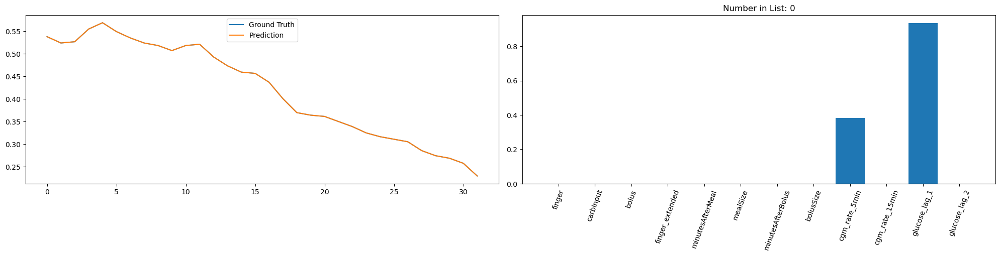

<Figure size 640x480 with 0 Axes>

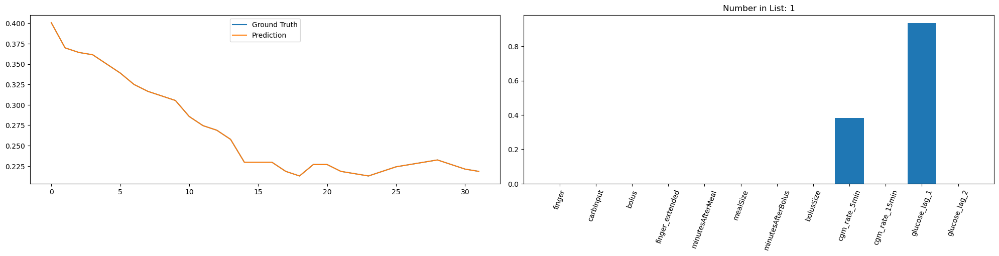

<Figure size 640x480 with 0 Axes>

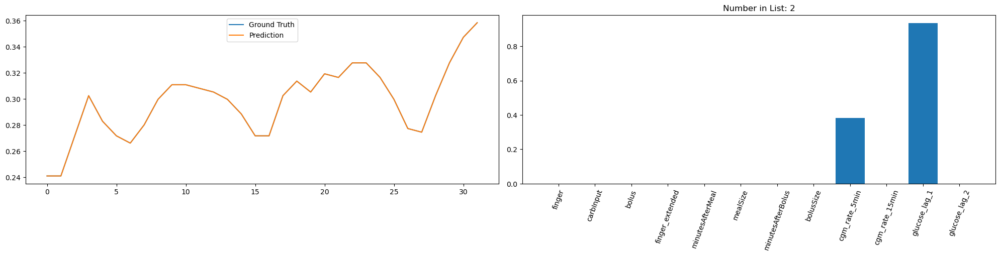

<Figure size 640x480 with 0 Axes>

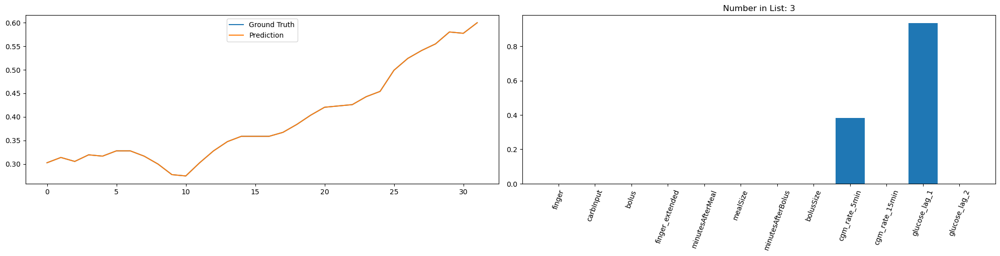

<Figure size 640x480 with 0 Axes>

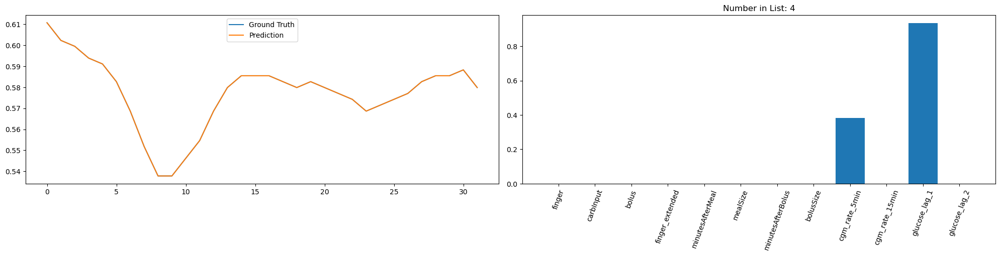

<Figure size 640x480 with 0 Axes>

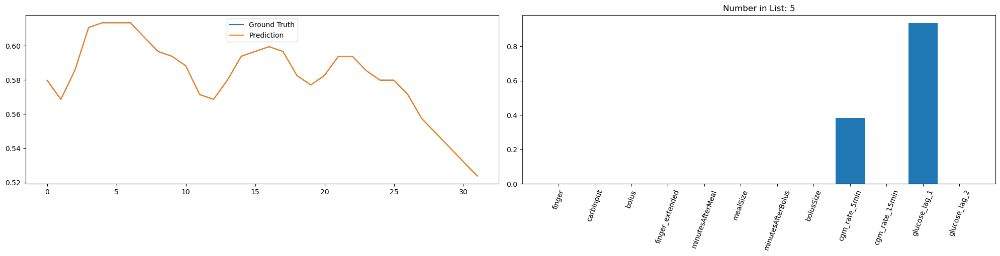

<Figure size 640x480 with 0 Axes>

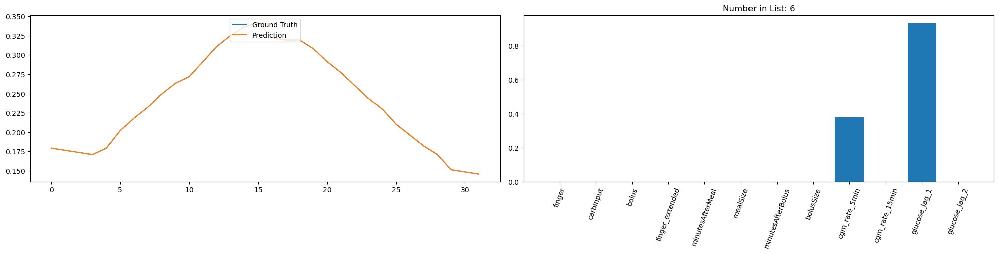

<Figure size 640x480 with 0 Axes>

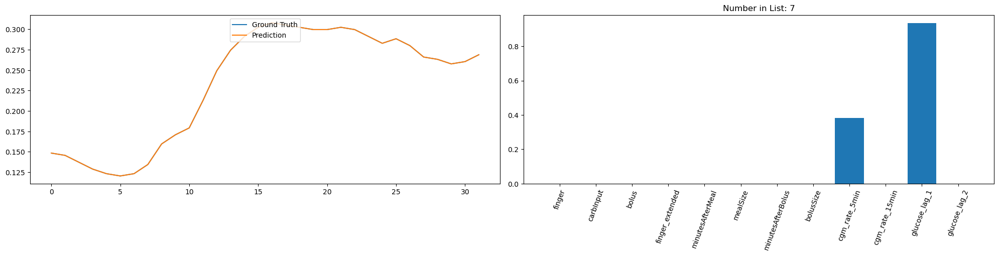

<Figure size 640x480 with 0 Axes>

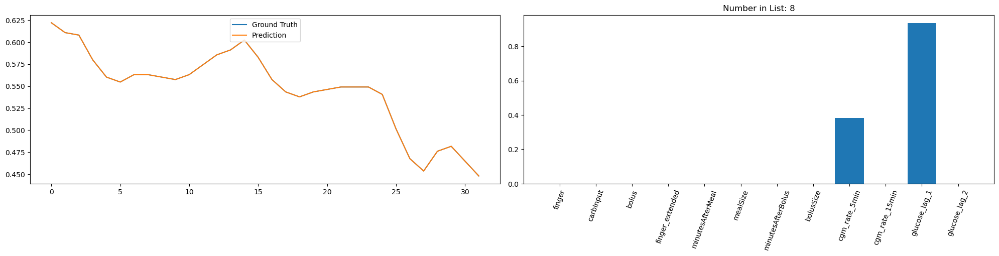

<Figure size 640x480 with 0 Axes>

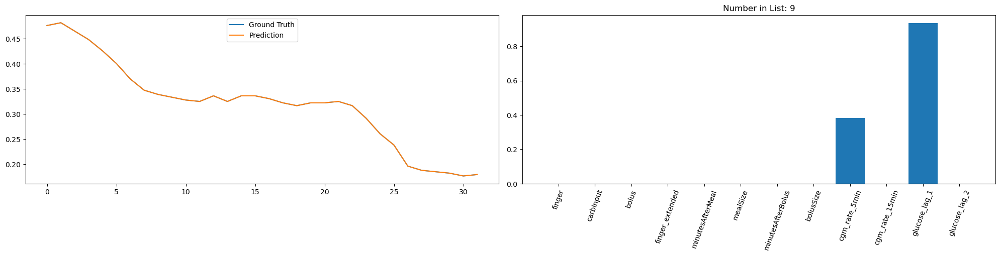

<Figure size 640x480 with 0 Axes>

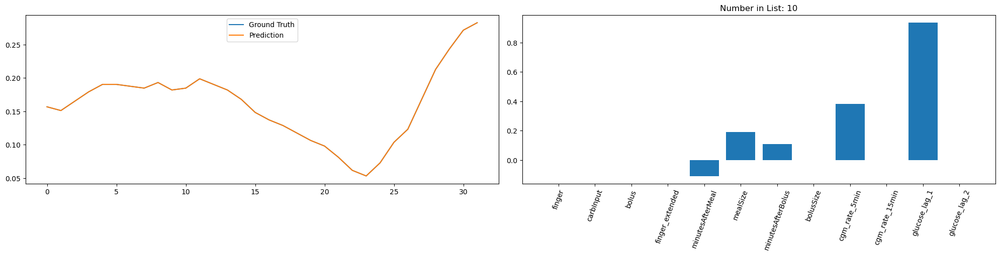

<Figure size 640x480 with 0 Axes>

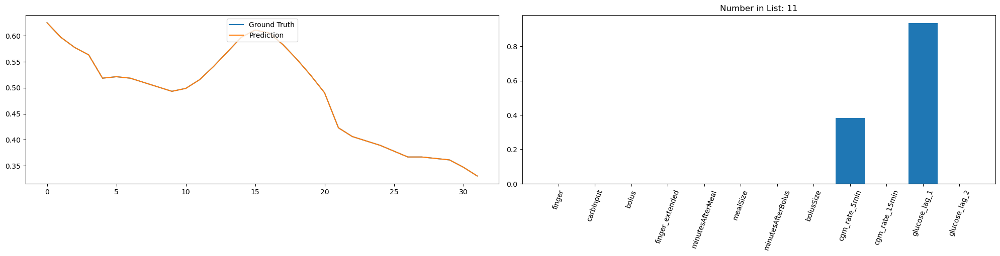

<Figure size 640x480 with 0 Axes>

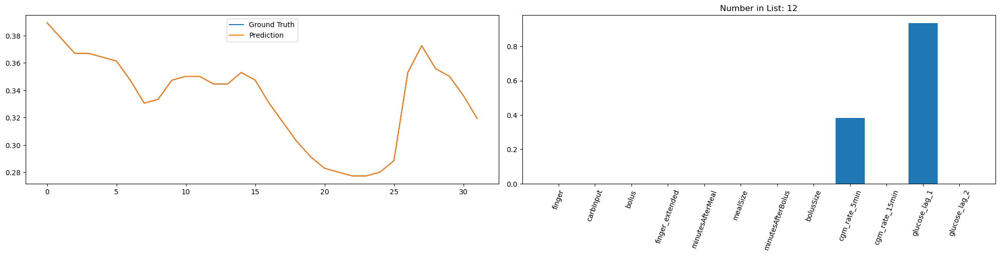

<Figure size 640x480 with 0 Axes>

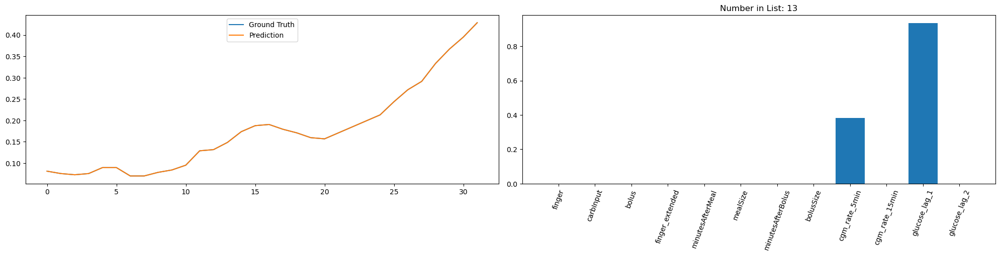

<Figure size 640x480 with 0 Axes>

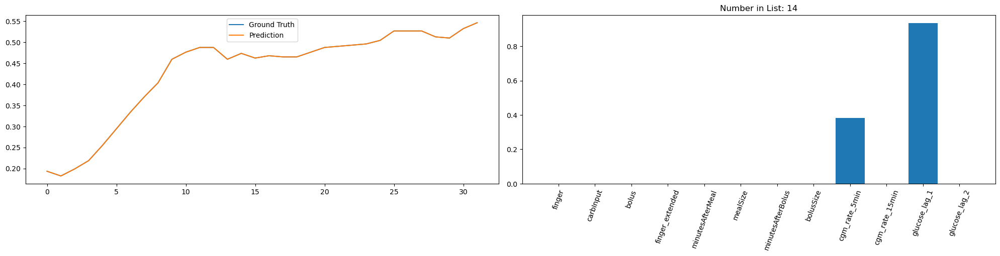

<Figure size 640x480 with 0 Axes>

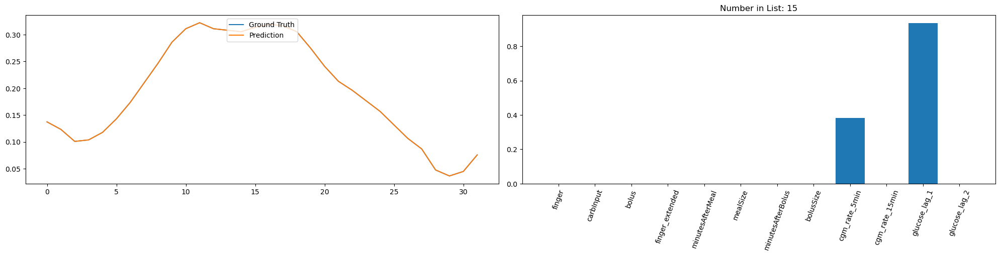

<Figure size 640x480 with 0 Axes>

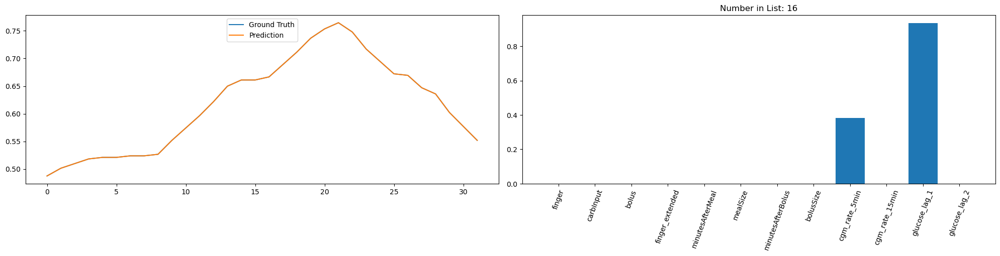

<Figure size 640x480 with 0 Axes>

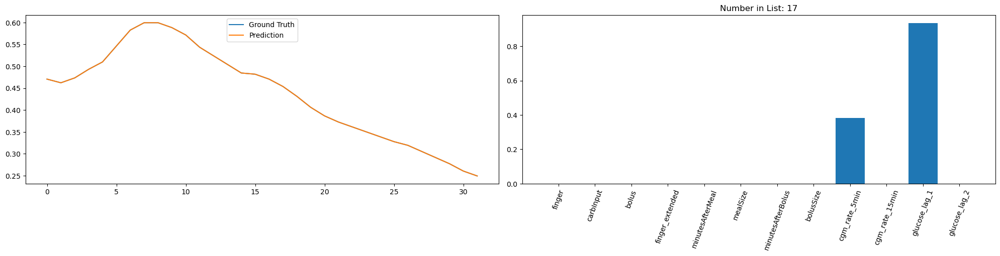

<Figure size 640x480 with 0 Axes>

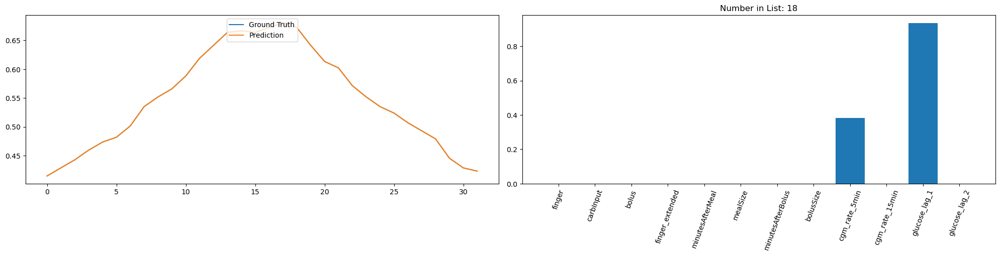

<Figure size 640x480 with 0 Axes>

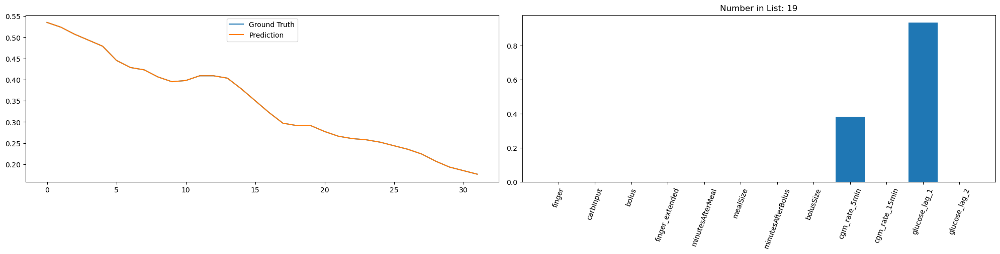

<Figure size 640x480 with 0 Axes>

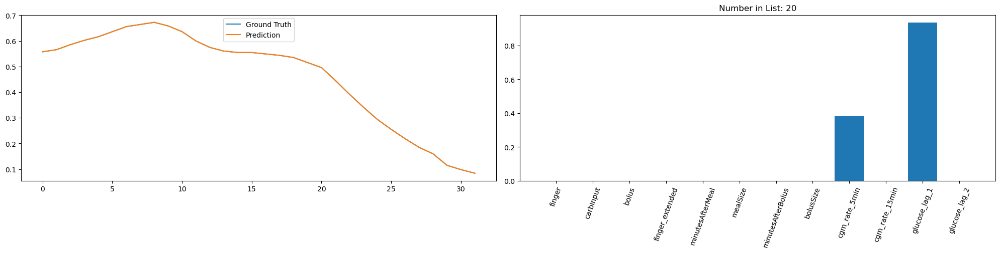

<Figure size 640x480 with 0 Axes>

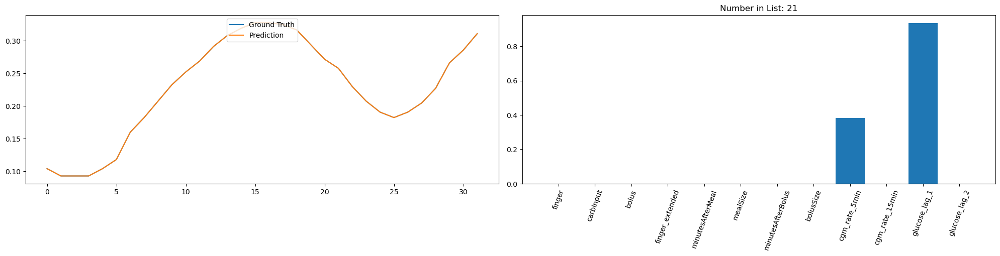

<Figure size 640x480 with 0 Axes>

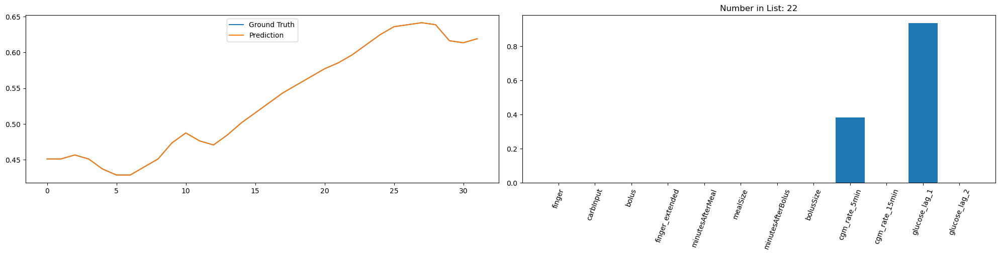

<Figure size 640x480 with 0 Axes>

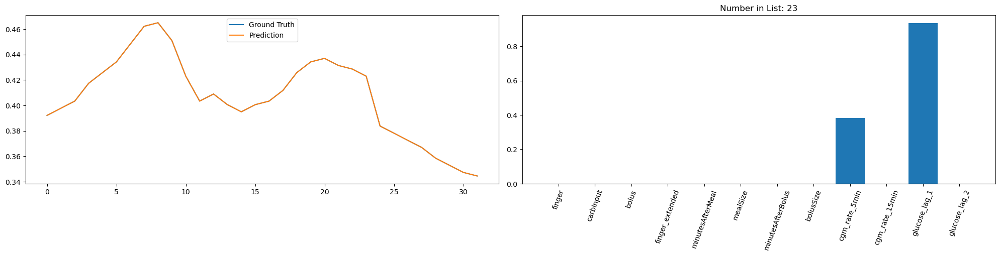

<Figure size 640x480 with 0 Axes>

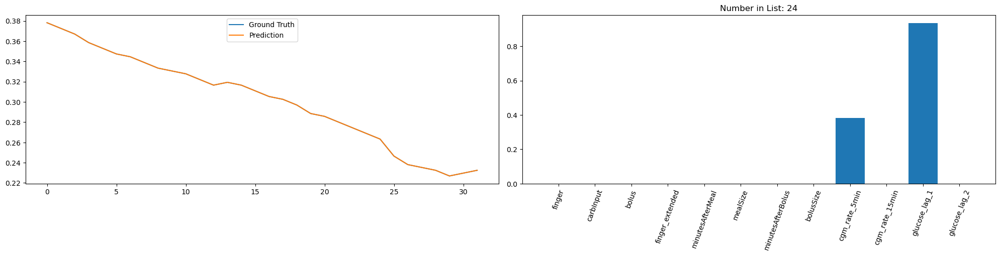

<Figure size 640x480 with 0 Axes>

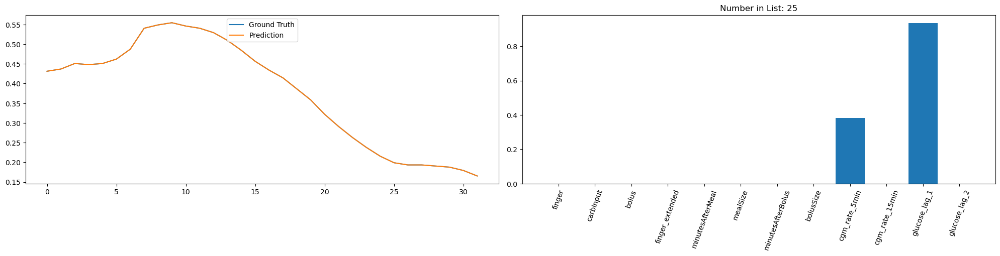

<Figure size 640x480 with 0 Axes>

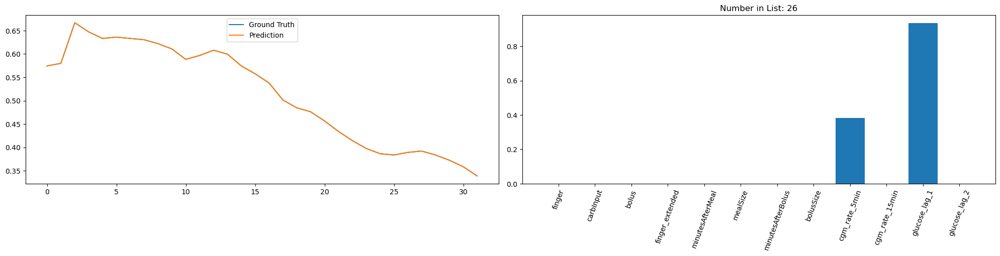

<Figure size 640x480 with 0 Axes>

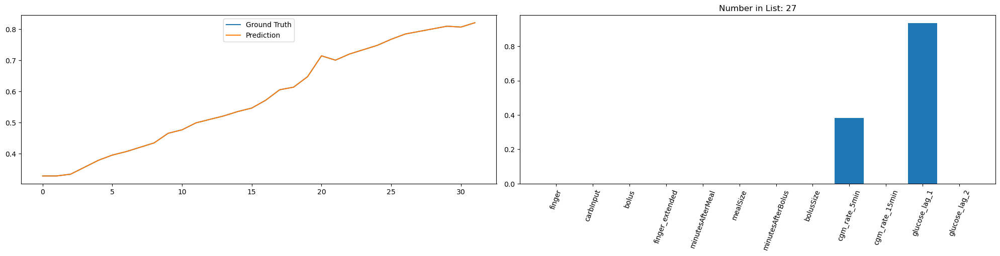

<Figure size 640x480 with 0 Axes>

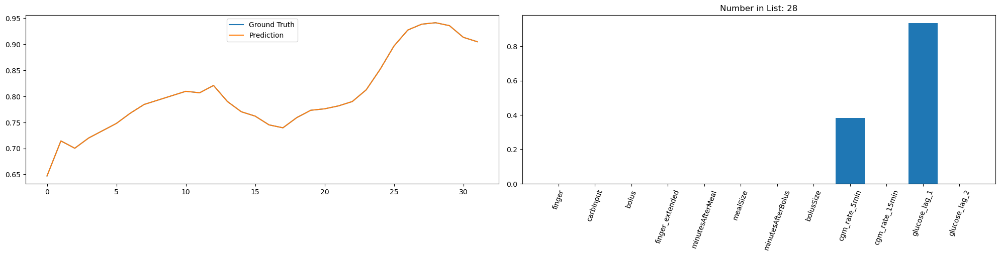

<Figure size 640x480 with 0 Axes>

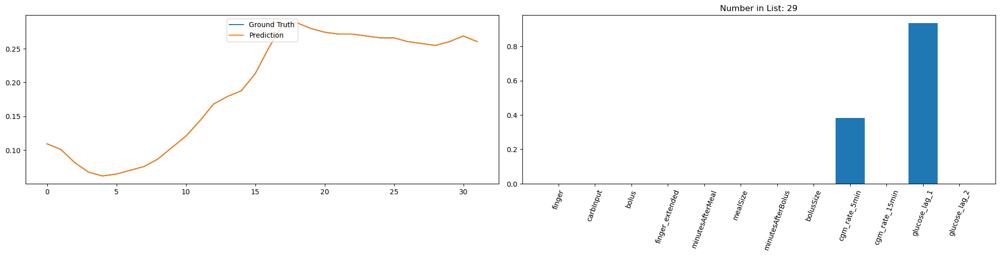

<Figure size 640x480 with 0 Axes>

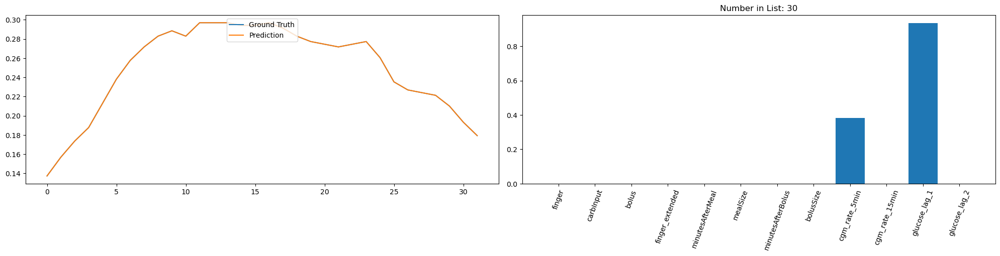

<Figure size 640x480 with 0 Axes>

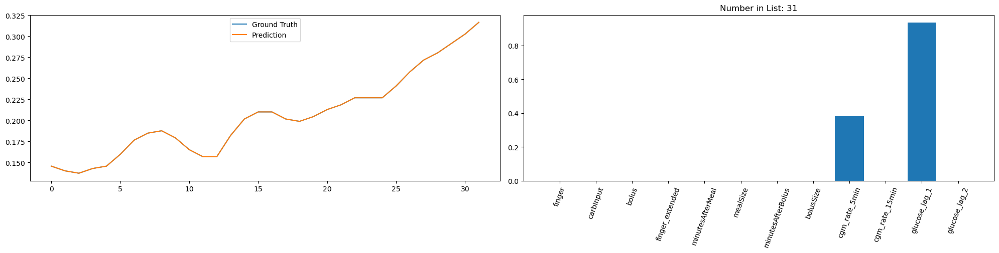

<Figure size 640x480 with 0 Axes>

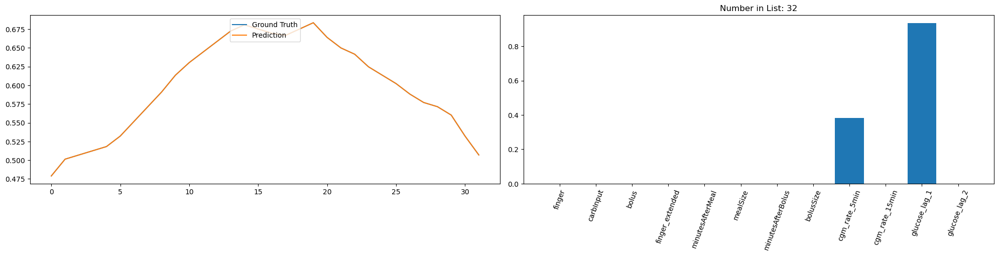

<Figure size 640x480 with 0 Axes>

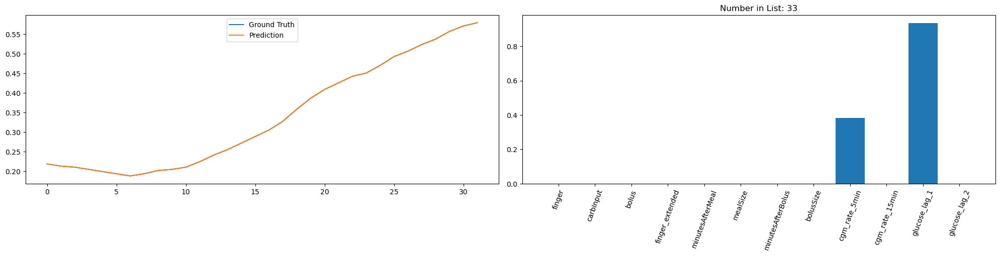

<Figure size 640x480 with 0 Axes>

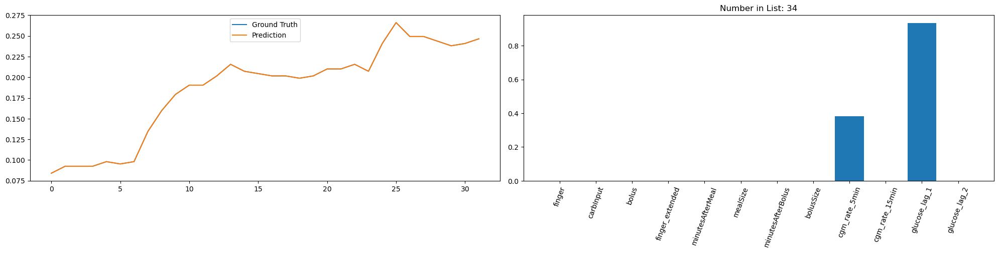

<Figure size 640x480 with 0 Axes>

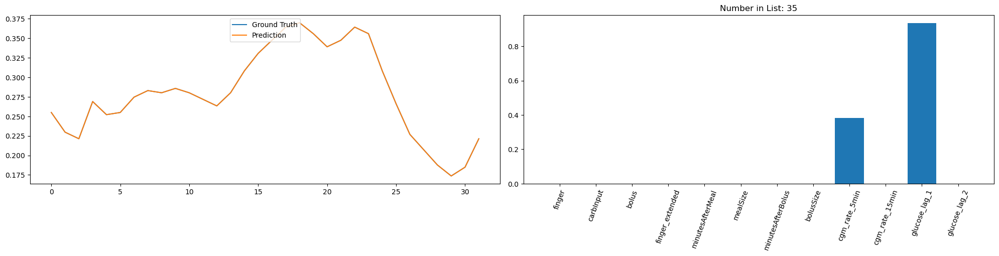

<Figure size 640x480 with 0 Axes>

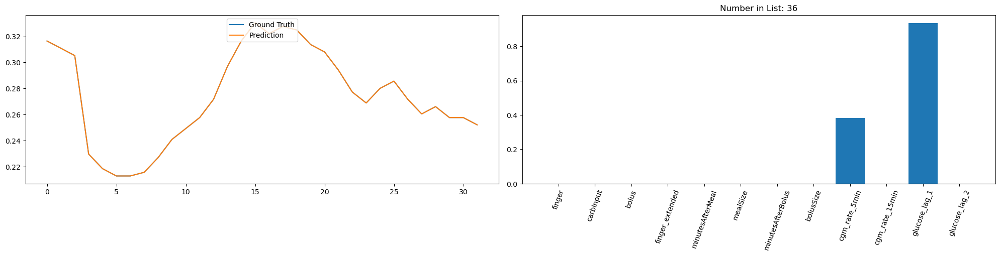

<Figure size 640x480 with 0 Axes>

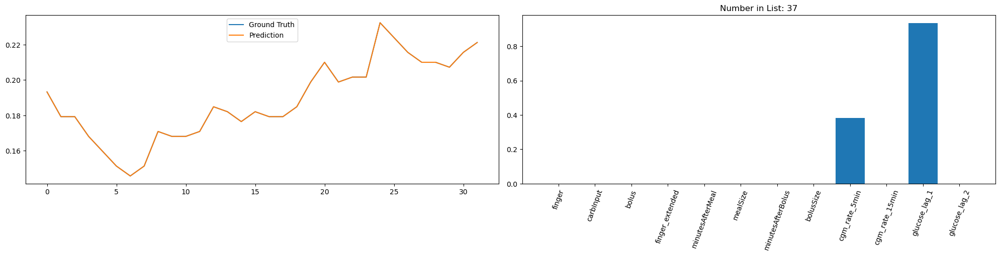

<Figure size 640x480 with 0 Axes>

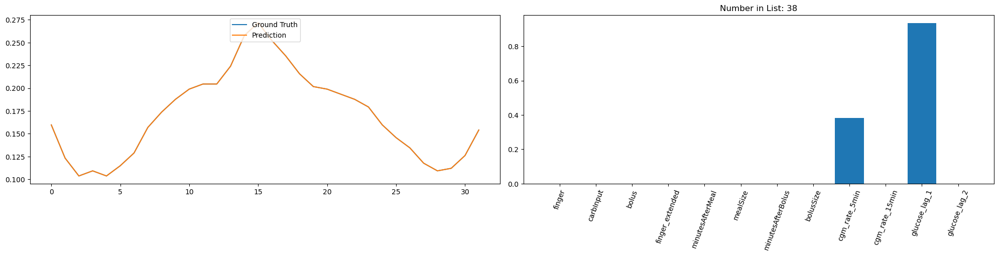

<Figure size 640x480 with 0 Axes>

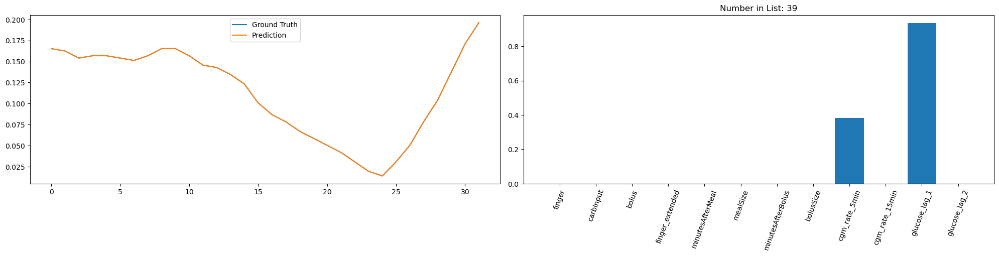

<Figure size 640x480 with 0 Axes>

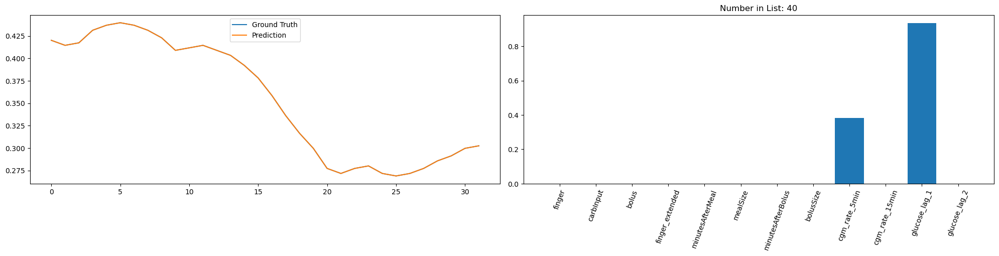

<Figure size 640x480 with 0 Axes>

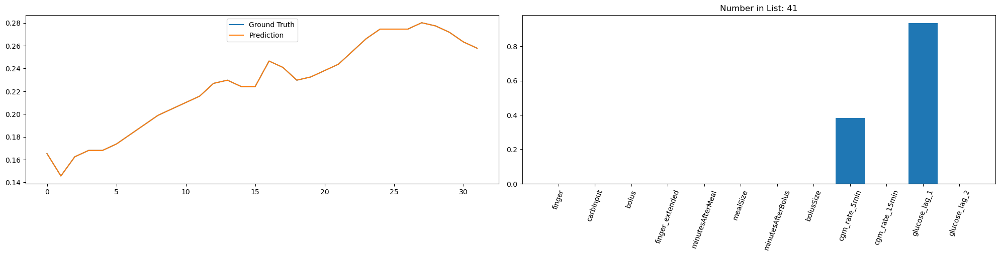

<Figure size 640x480 with 0 Axes>

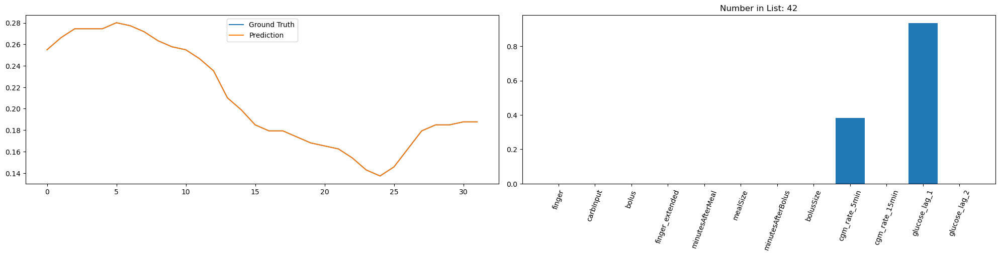

<Figure size 640x480 with 0 Axes>

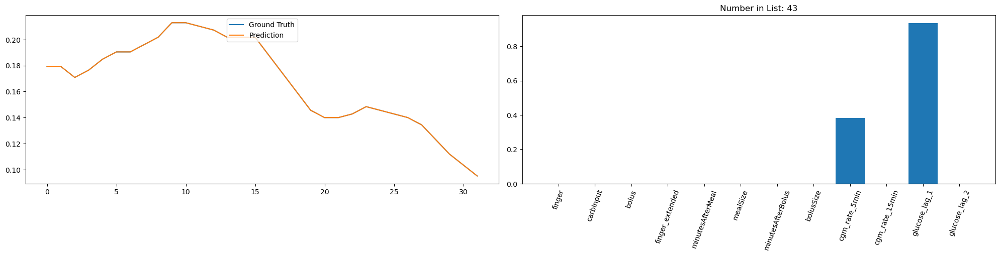

<Figure size 640x480 with 0 Axes>

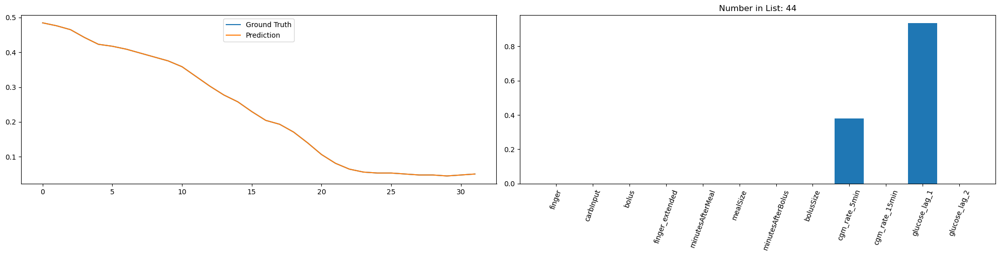

<Figure size 640x480 with 0 Axes>

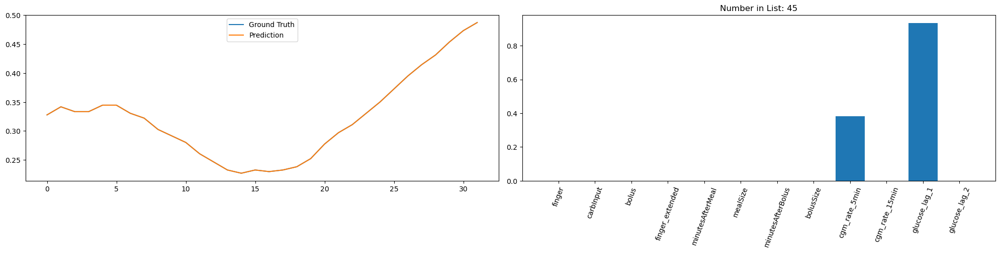

<Figure size 640x480 with 0 Axes>

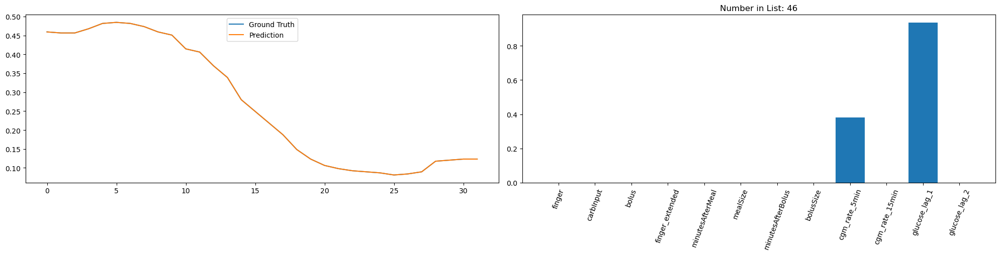

<Figure size 640x480 with 0 Axes>

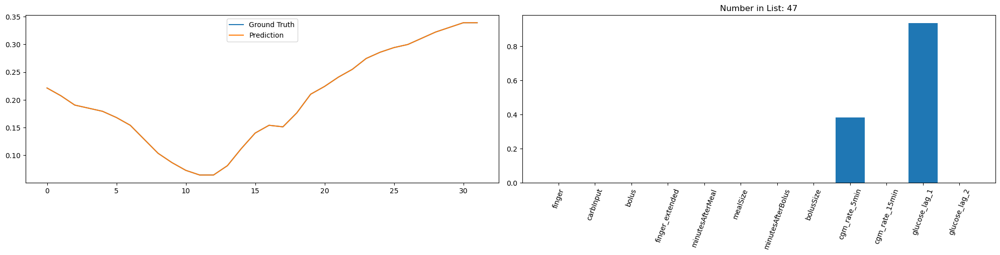

<Figure size 640x480 with 0 Axes>

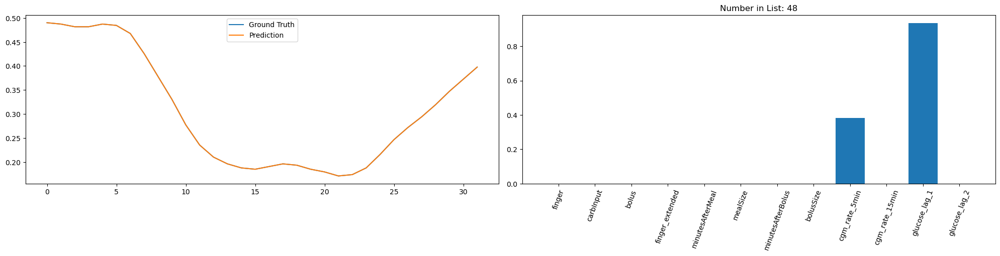

<Figure size 640x480 with 0 Axes>

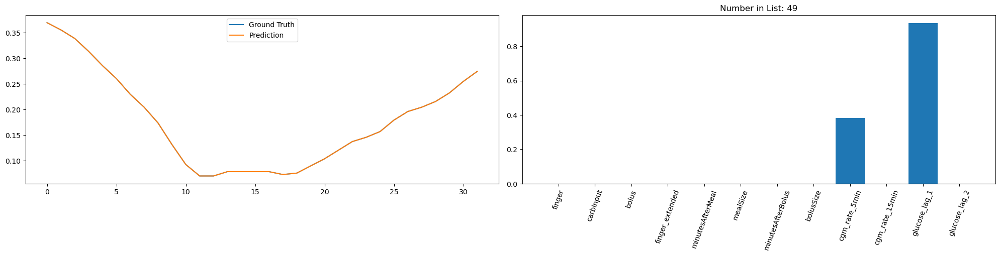

<Figure size 640x480 with 0 Axes>

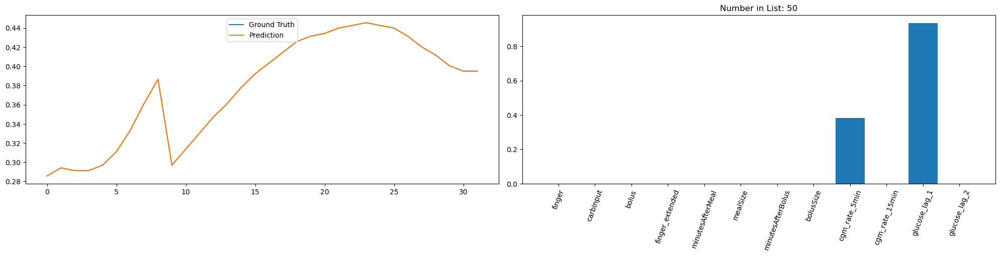

<Figure size 640x480 with 0 Axes>

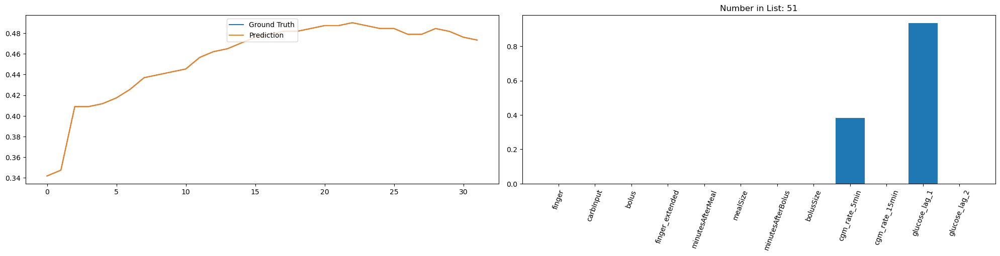

<Figure size 640x480 with 0 Axes>

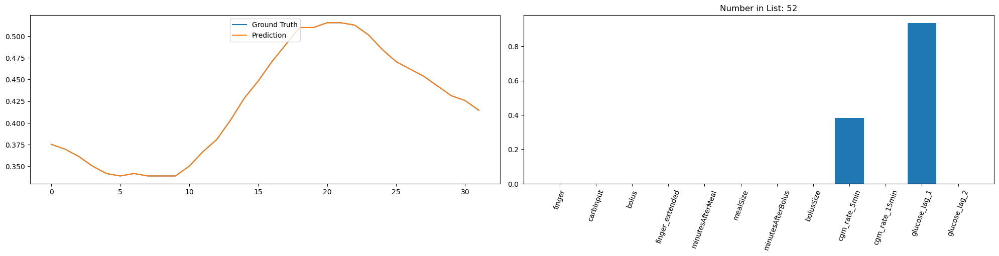

<Figure size 640x480 with 0 Axes>

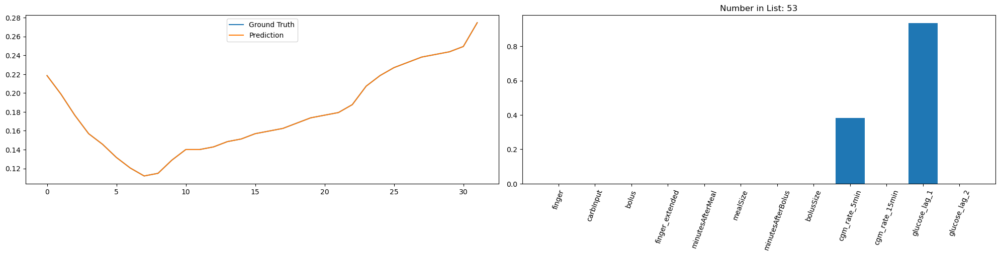

<Figure size 640x480 with 0 Axes>

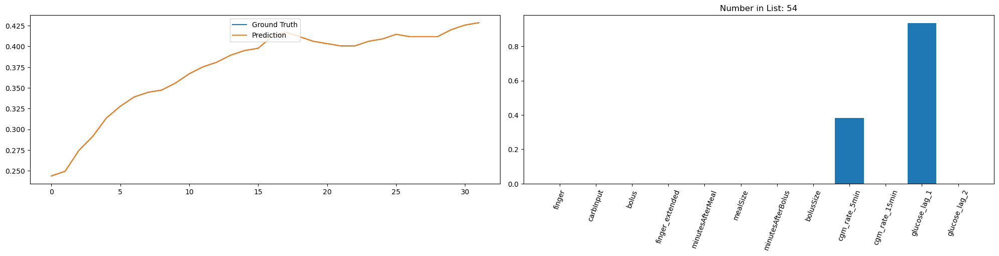

<Figure size 640x480 with 0 Axes>

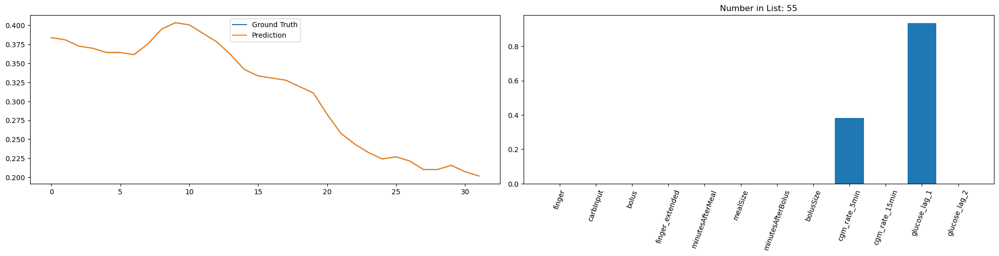

<Figure size 640x480 with 0 Axes>

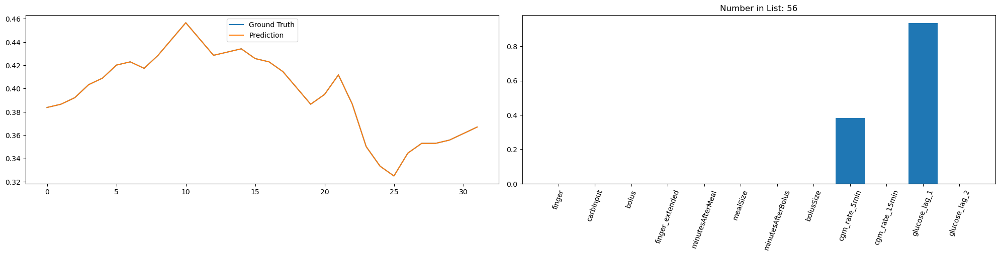

<Figure size 640x480 with 0 Axes>

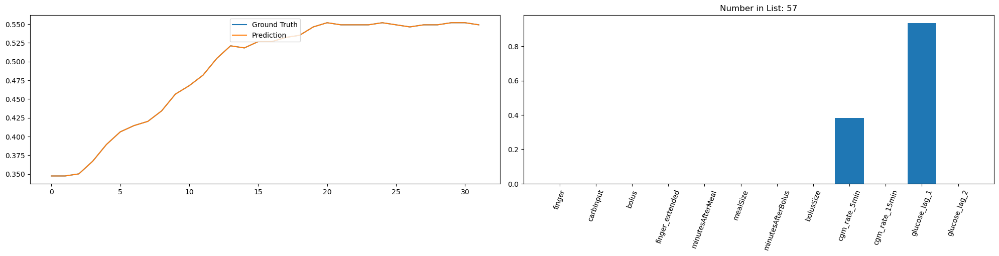

<Figure size 640x480 with 0 Axes>

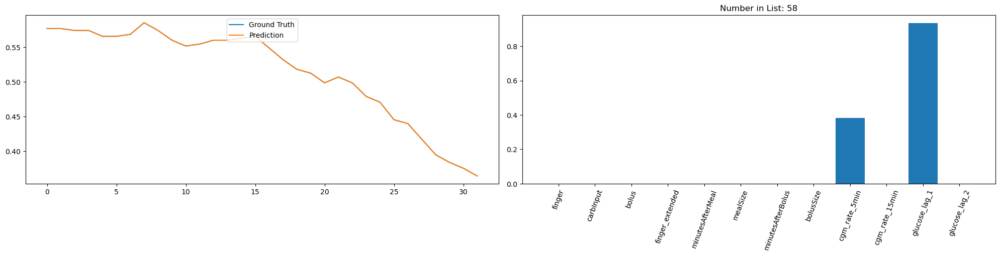

<Figure size 640x480 with 0 Axes>

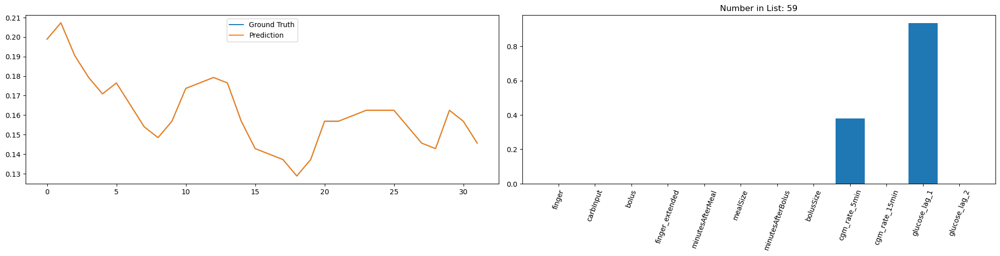

<Figure size 640x480 with 0 Axes>

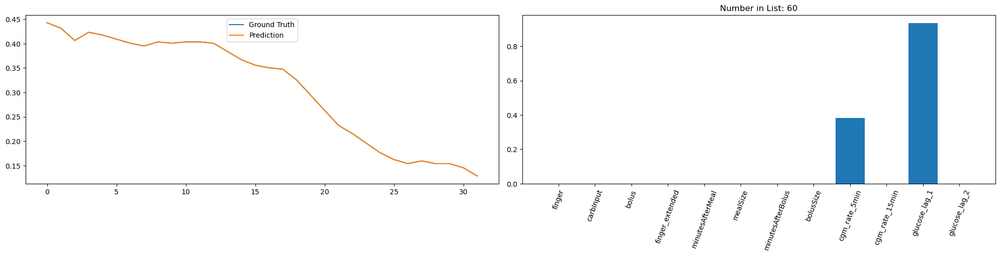

<Figure size 640x480 with 0 Axes>

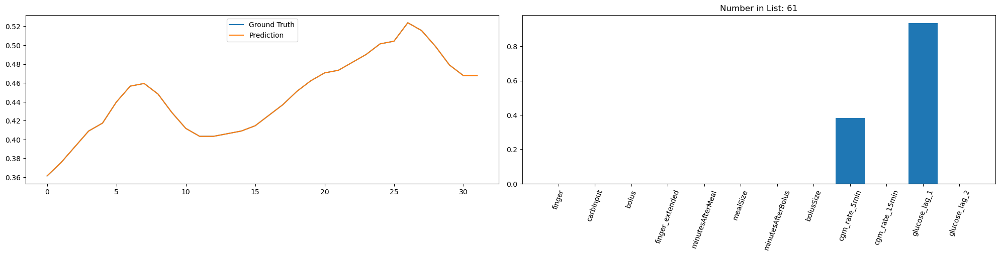

<Figure size 640x480 with 0 Axes>

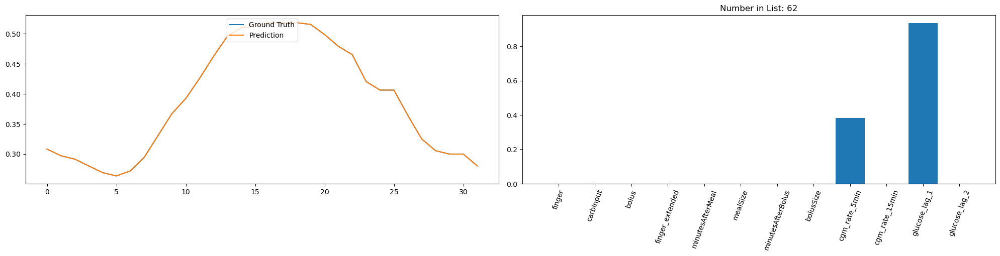

<Figure size 640x480 with 0 Axes>

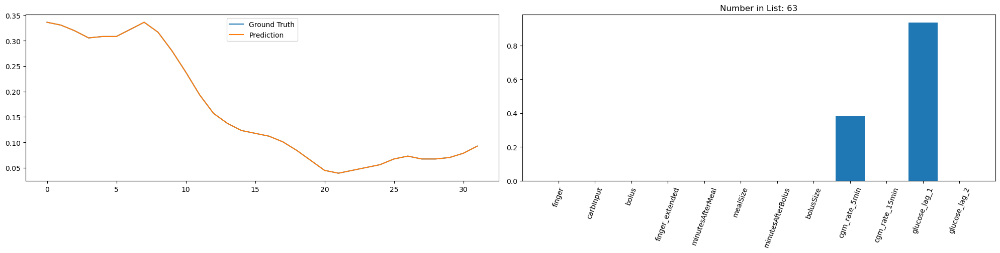

<Figure size 640x480 with 0 Axes>

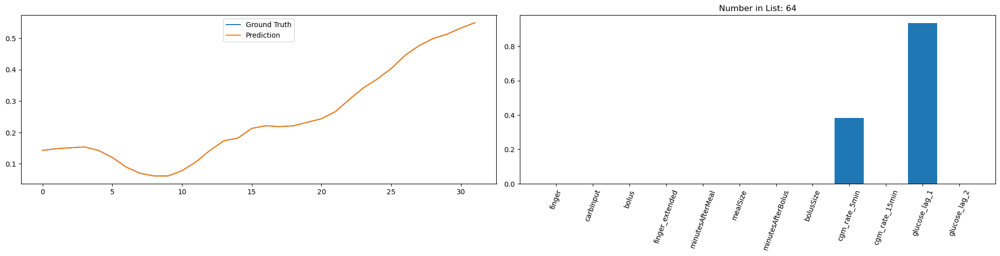

<Figure size 640x480 with 0 Axes>

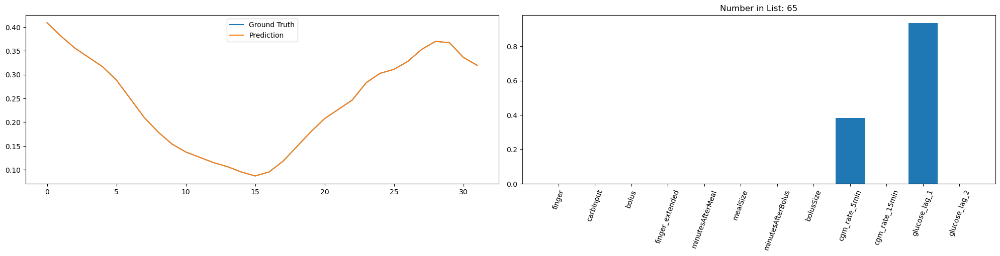

<Figure size 640x480 with 0 Axes>

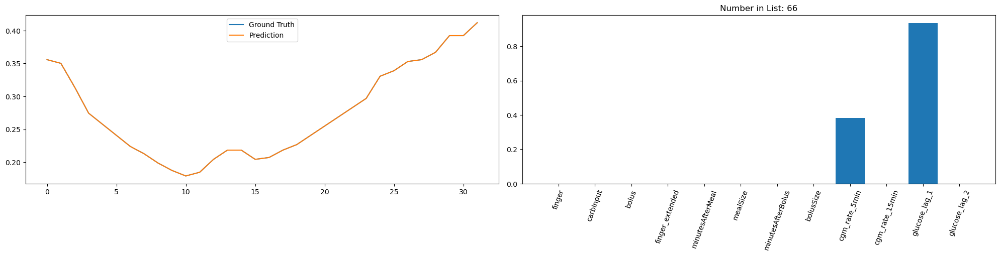

<Figure size 640x480 with 0 Axes>

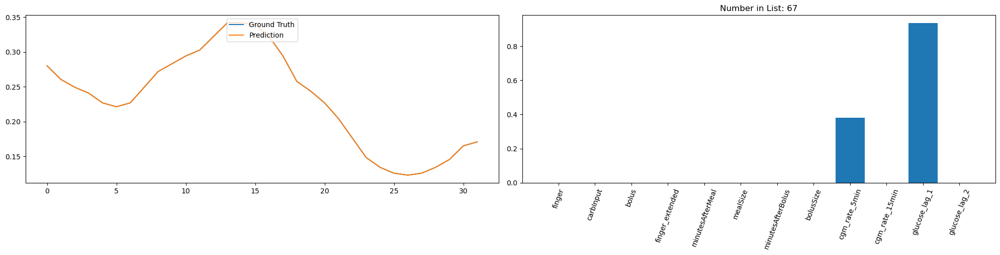

<Figure size 640x480 with 0 Axes>

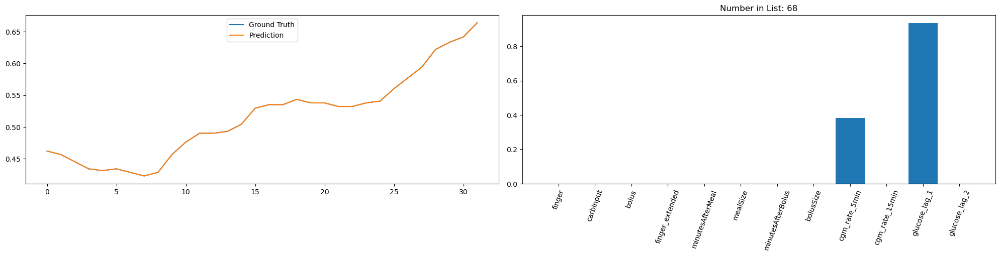

<Figure size 640x480 with 0 Axes>

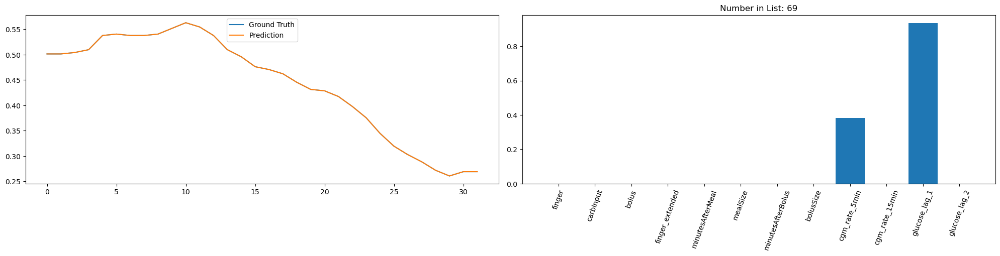

<Figure size 640x480 with 0 Axes>

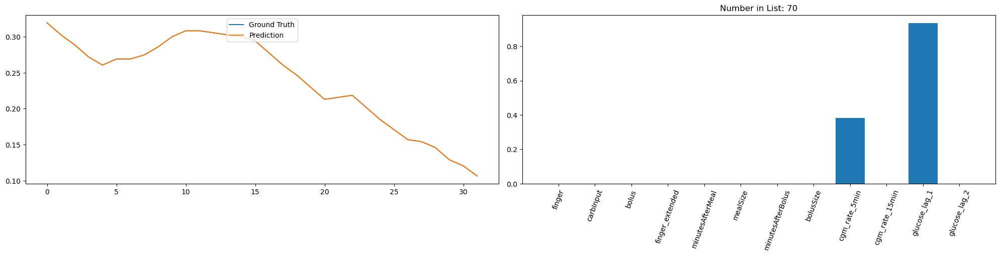

<Figure size 640x480 with 0 Axes>

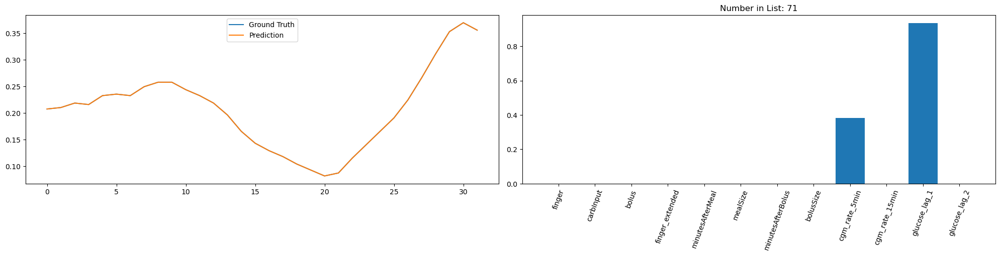

<Figure size 640x480 with 0 Axes>

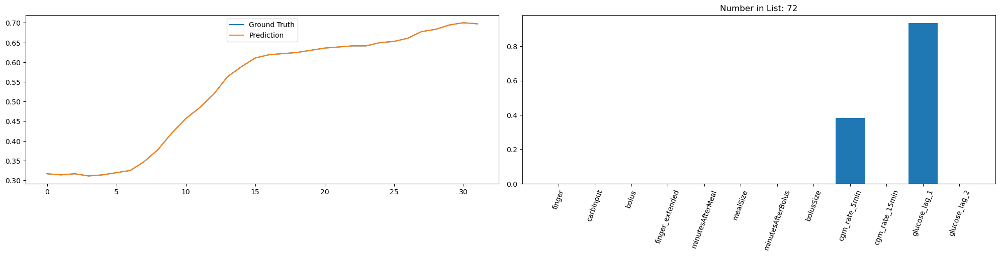

<Figure size 640x480 with 0 Axes>

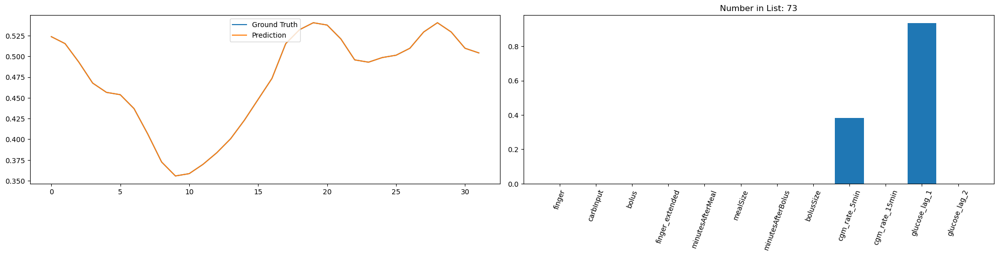

<Figure size 640x480 with 0 Axes>

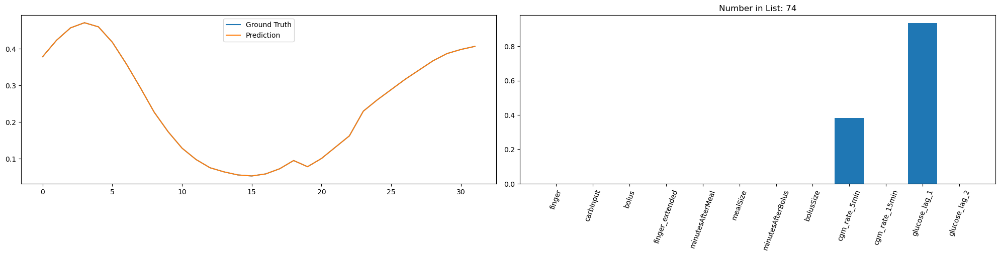

<Figure size 640x480 with 0 Axes>

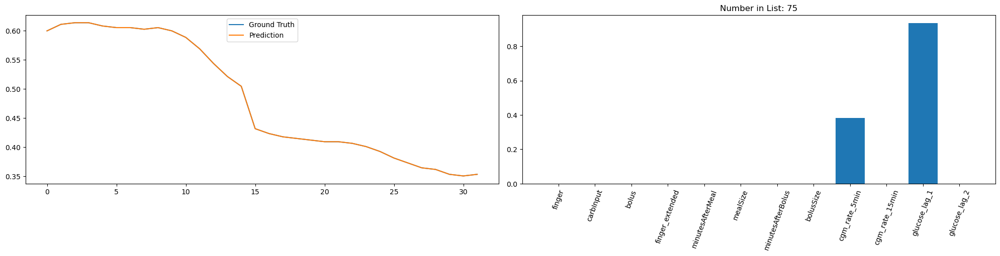

<Figure size 640x480 with 0 Axes>

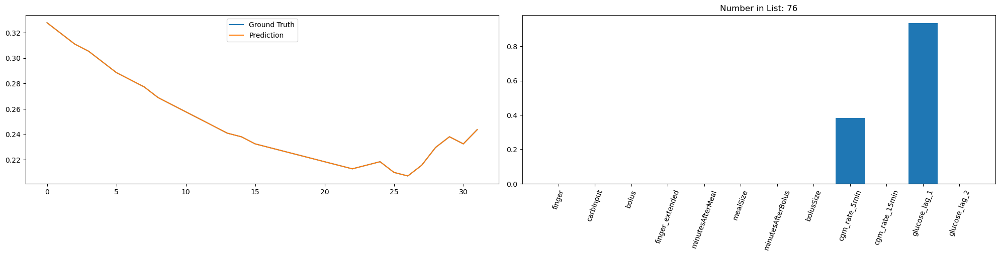

<Figure size 640x480 with 0 Axes>

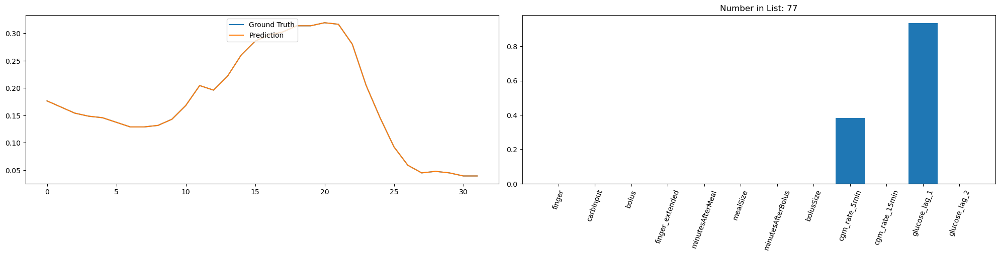

<Figure size 640x480 with 0 Axes>

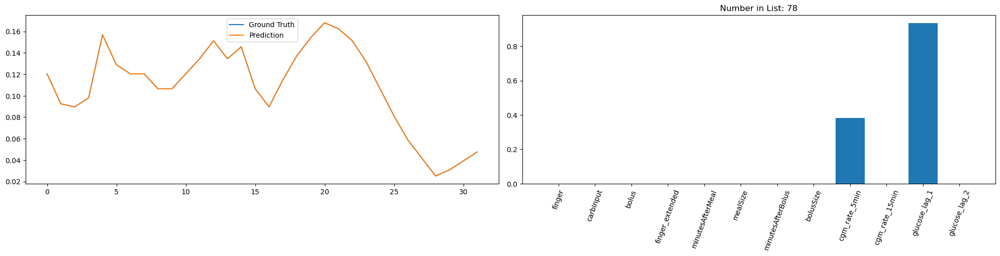

<Figure size 640x480 with 0 Axes>

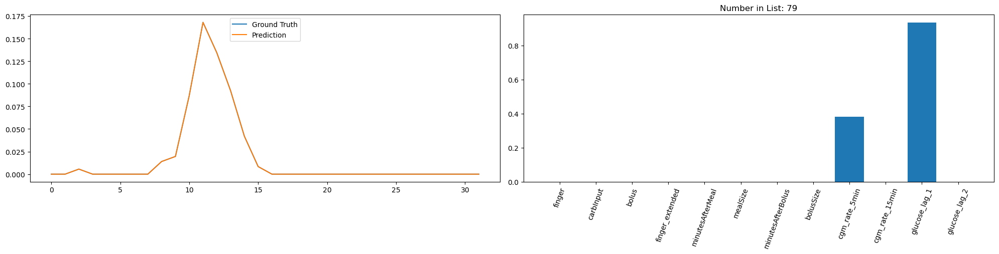

<Figure size 640x480 with 0 Axes>

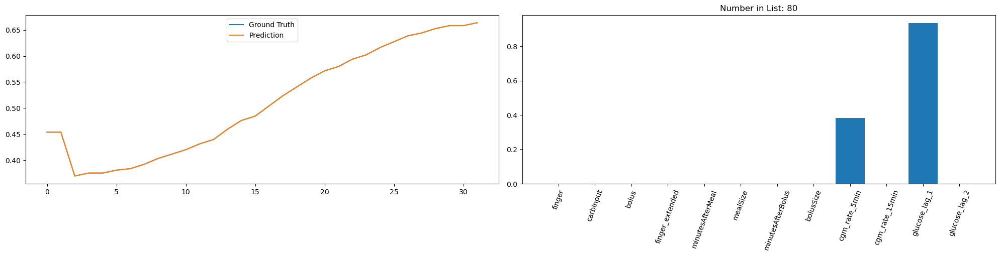

<Figure size 640x480 with 0 Axes>

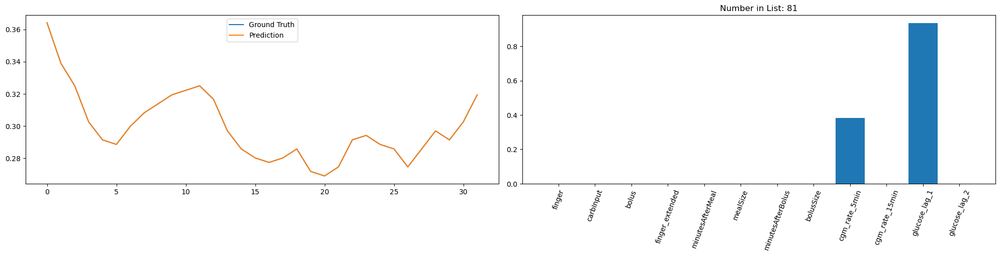

<Figure size 640x480 with 0 Axes>

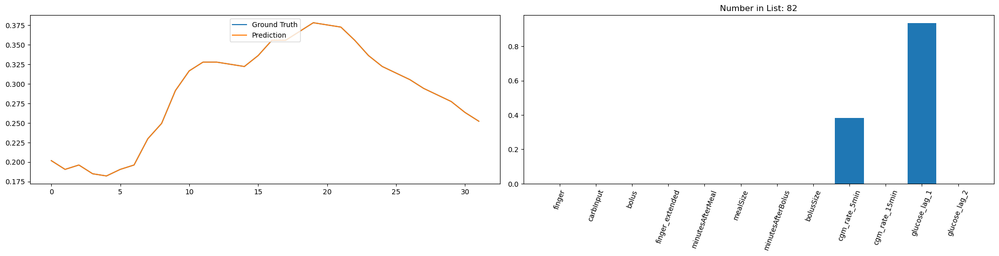

<Figure size 640x480 with 0 Axes>

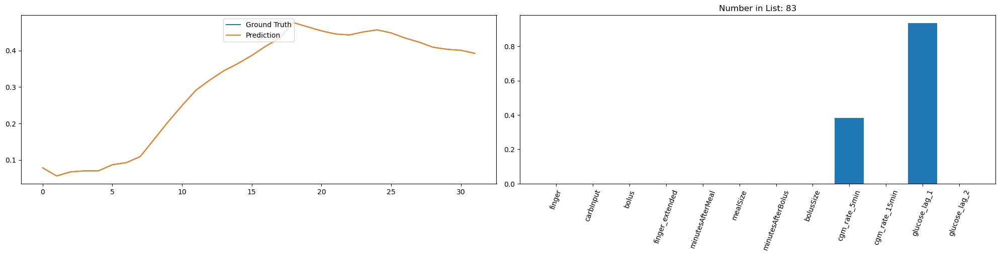

<Figure size 640x480 with 0 Axes>

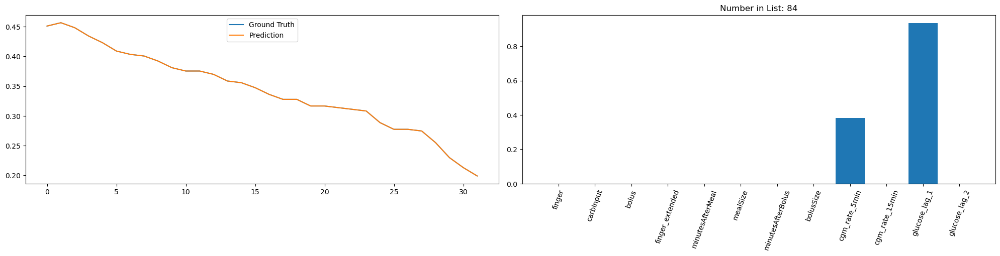

<Figure size 640x480 with 0 Axes>

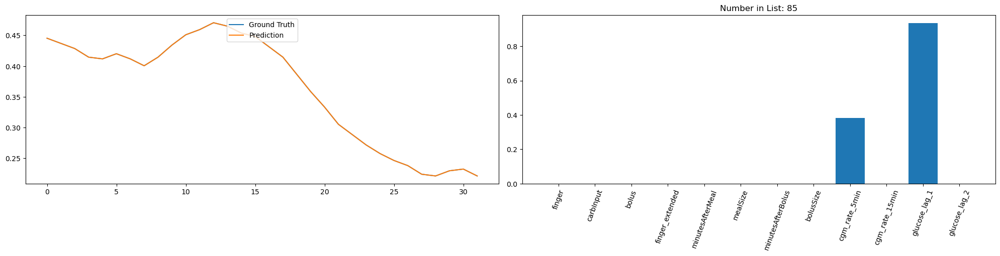

<Figure size 640x480 with 0 Axes>

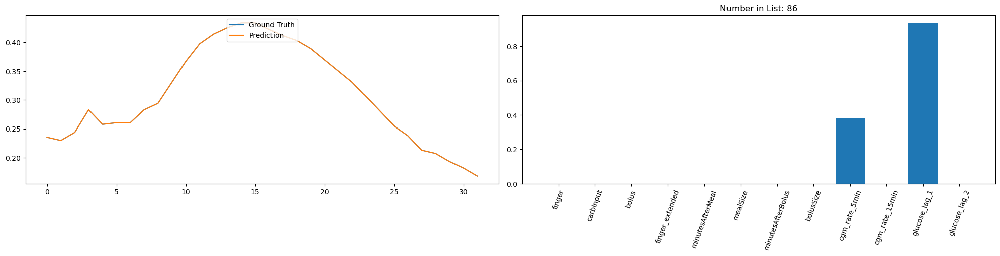

<Figure size 640x480 with 0 Axes>

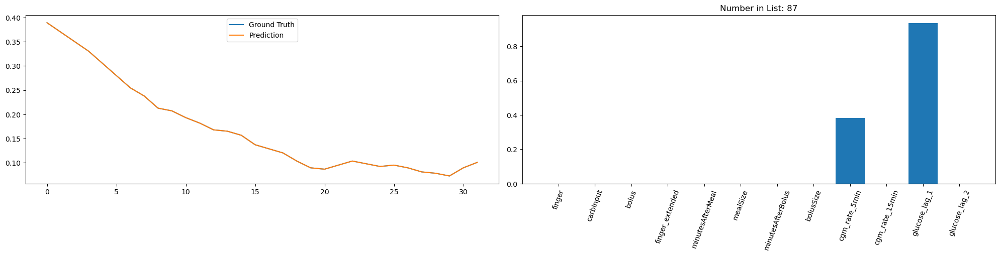

<Figure size 640x480 with 0 Axes>

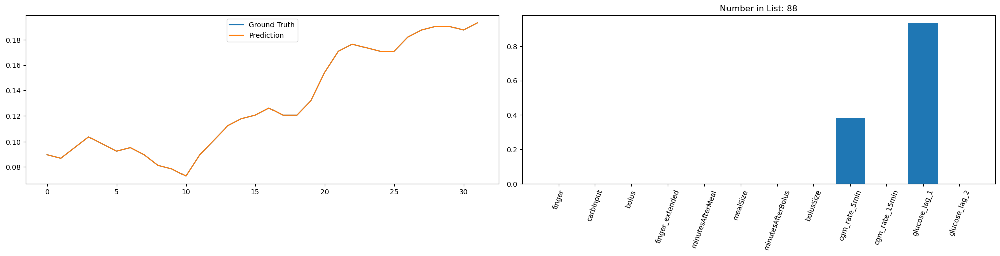

<Figure size 640x480 with 0 Axes>

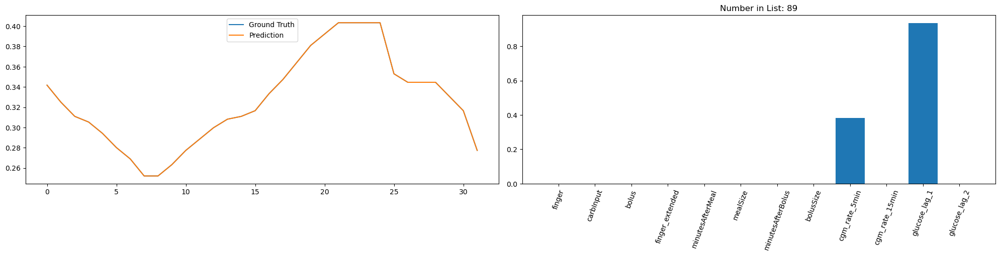

<Figure size 640x480 with 0 Axes>

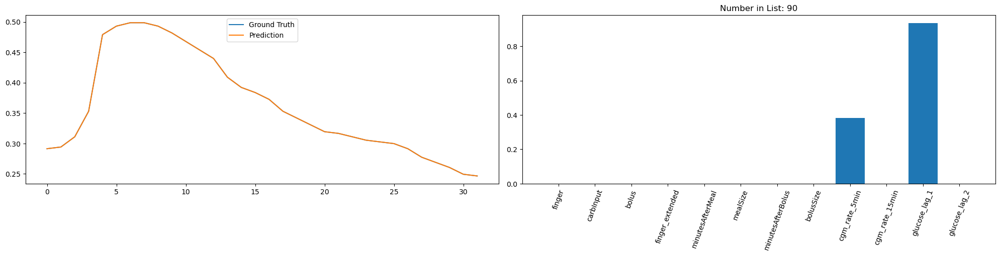

<Figure size 640x480 with 0 Axes>

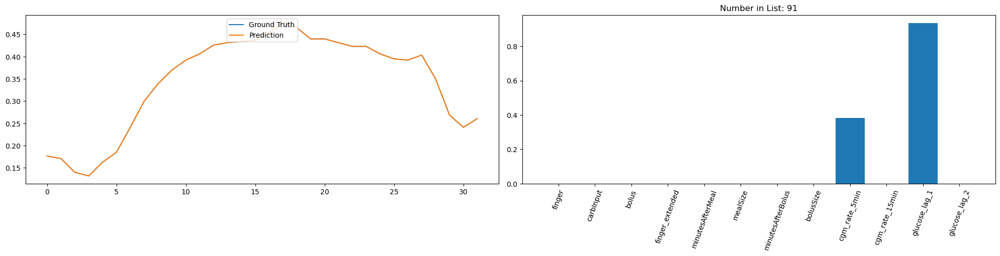

<Figure size 640x480 with 0 Axes>

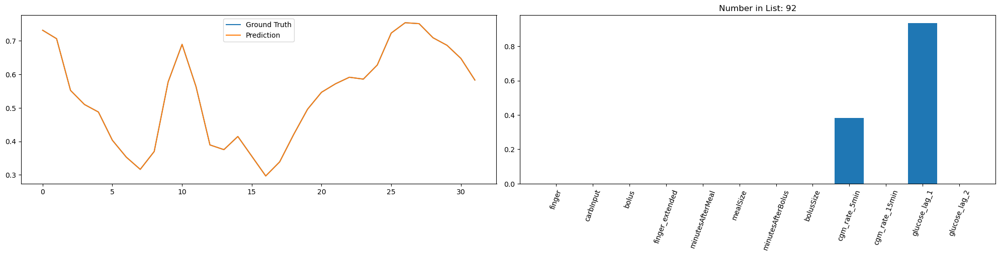

<Figure size 640x480 with 0 Axes>

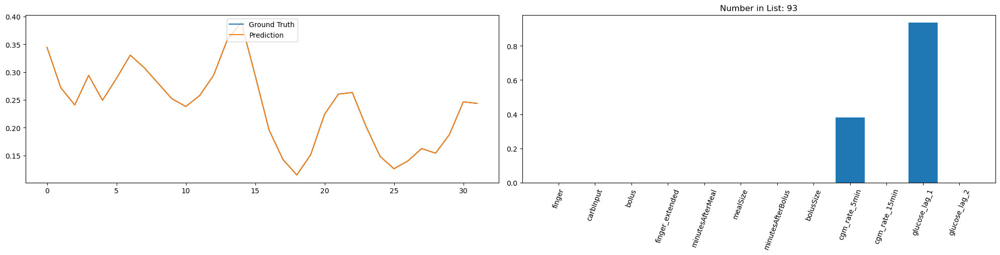

<Figure size 640x480 with 0 Axes>

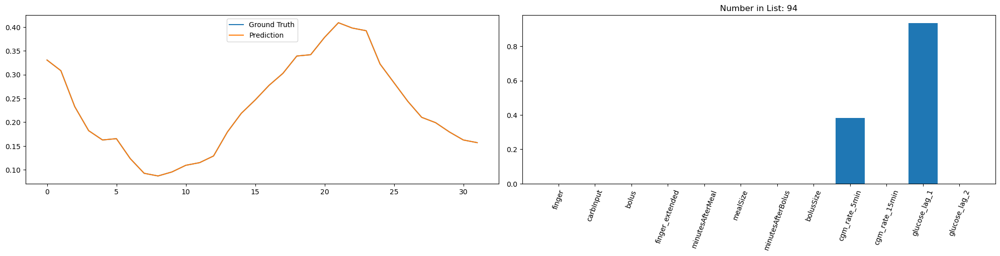

<Figure size 640x480 with 0 Axes>

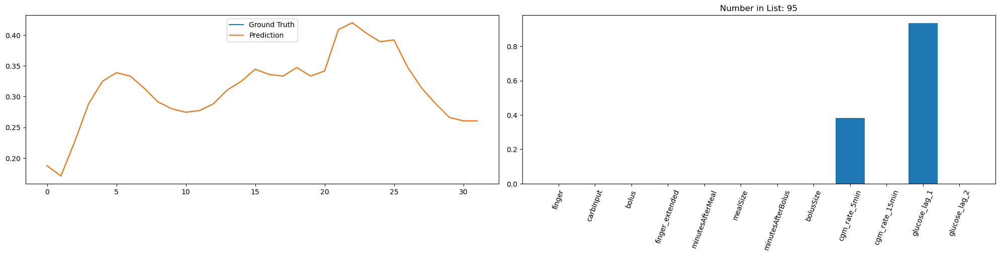

<Figure size 640x480 with 0 Axes>

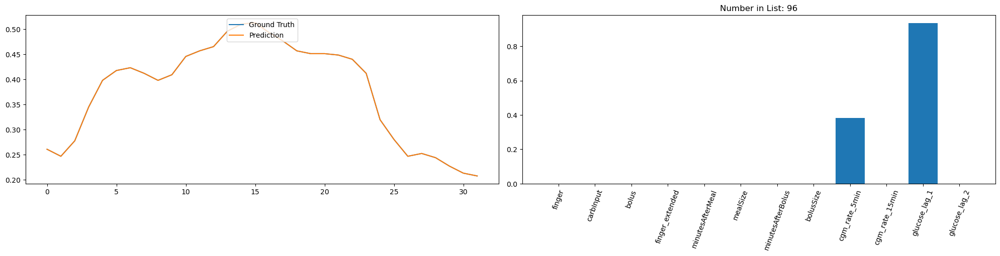

<Figure size 640x480 with 0 Axes>

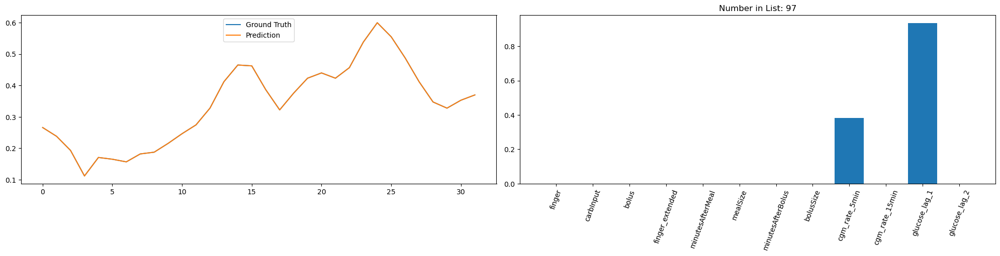

<Figure size 640x480 with 0 Axes>

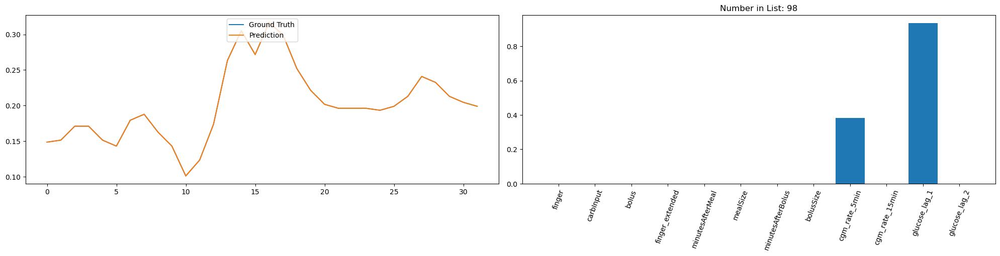

<Figure size 640x480 with 0 Axes>

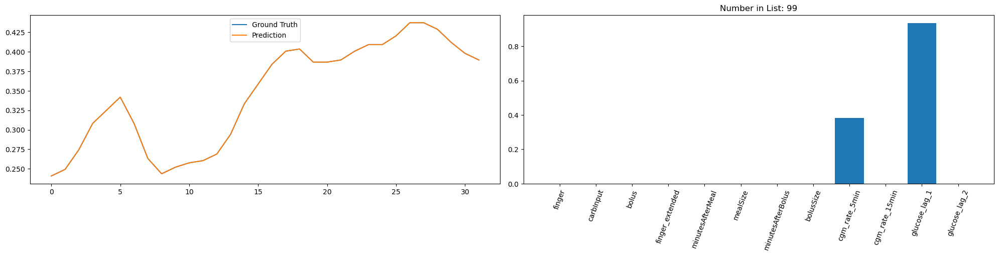

<Figure size 640x480 with 0 Axes>

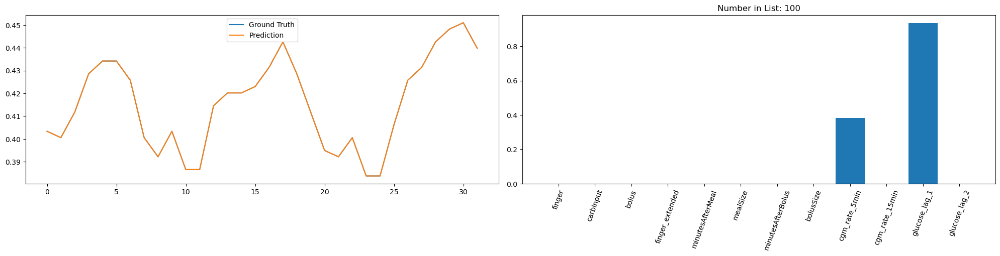

<Figure size 640x480 with 0 Axes>

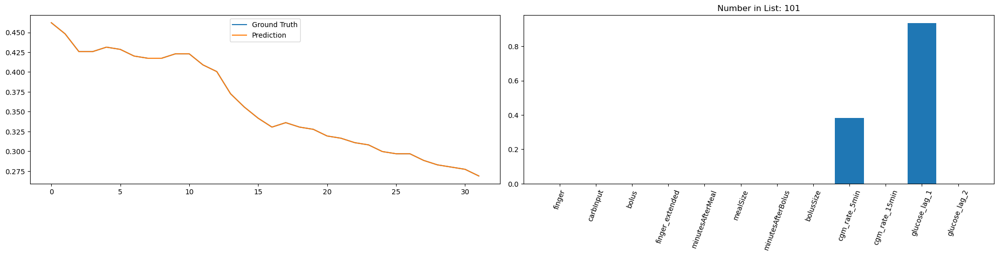

<Figure size 640x480 with 0 Axes>

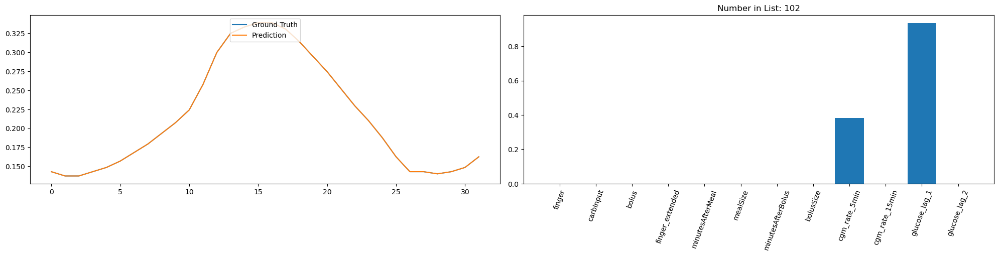

<Figure size 640x480 with 0 Axes>

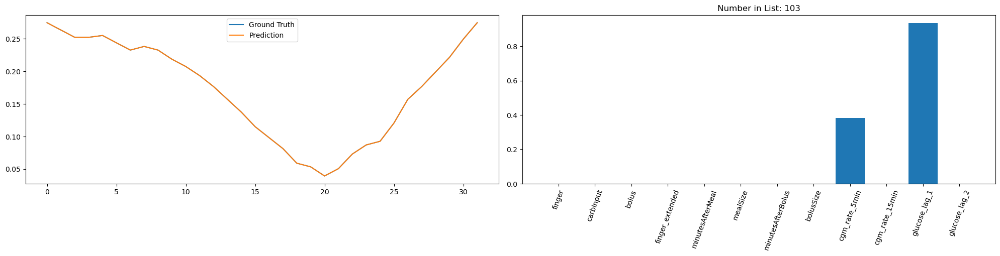

<Figure size 640x480 with 0 Axes>

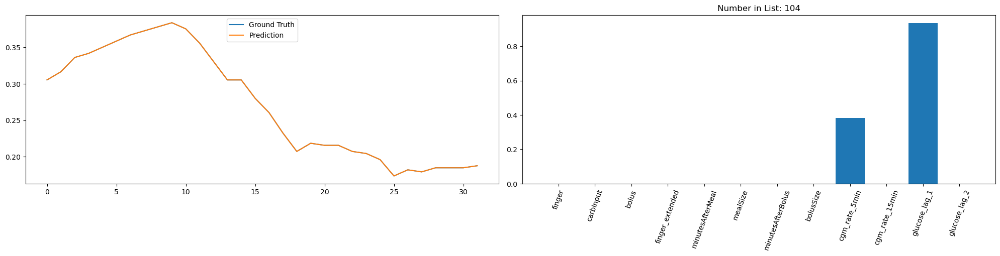

<Figure size 640x480 with 0 Axes>

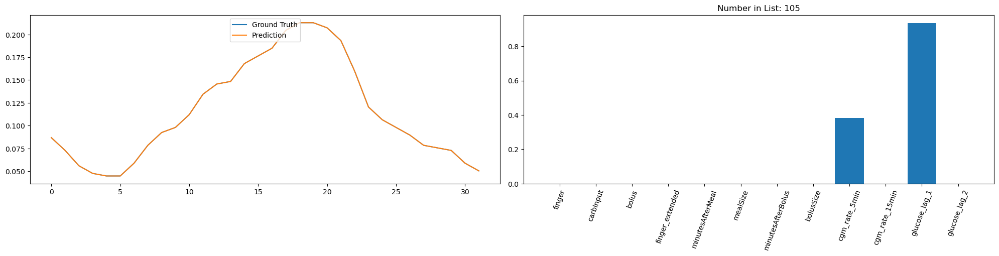

<Figure size 640x480 with 0 Axes>

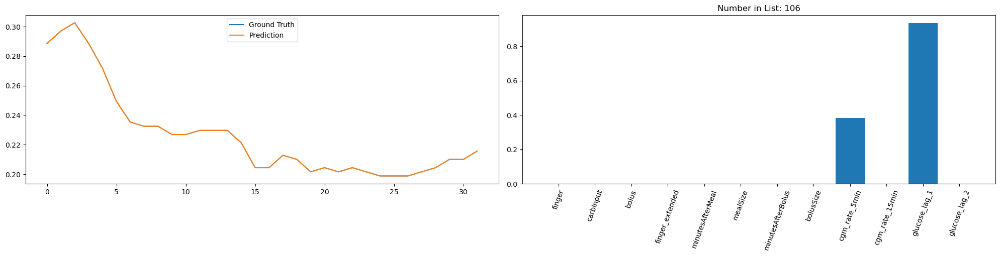

<Figure size 640x480 with 0 Axes>

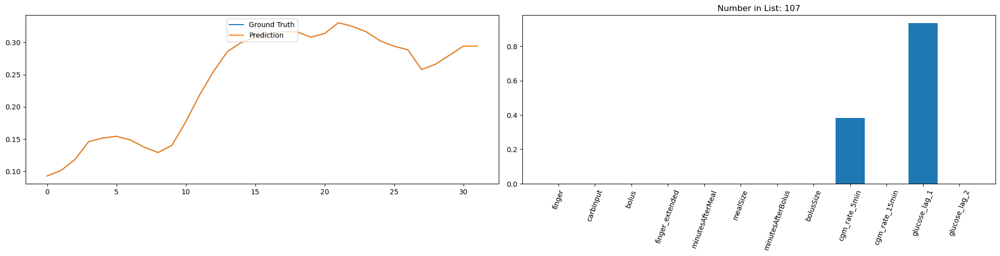

<Figure size 640x480 with 0 Axes>

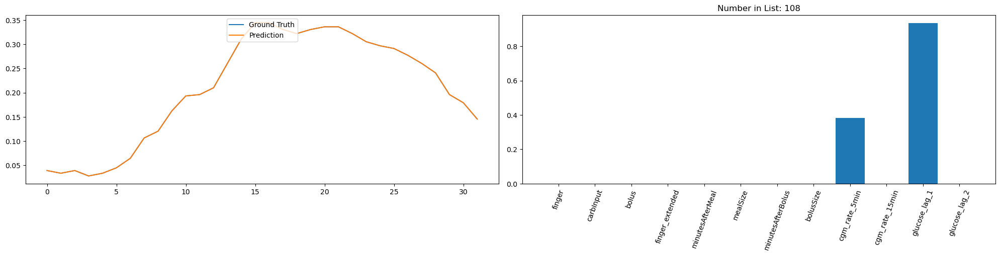

<Figure size 640x480 with 0 Axes>

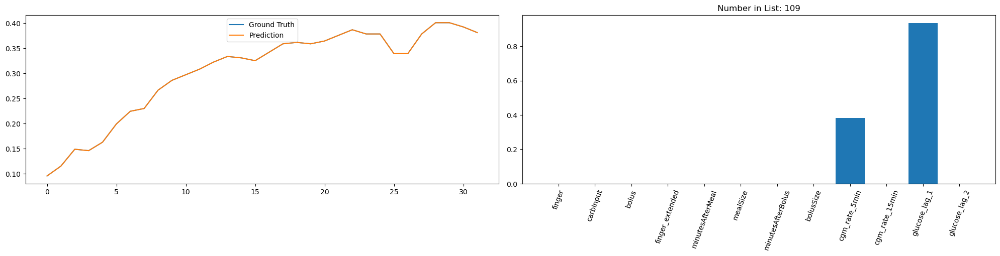

<Figure size 640x480 with 0 Axes>

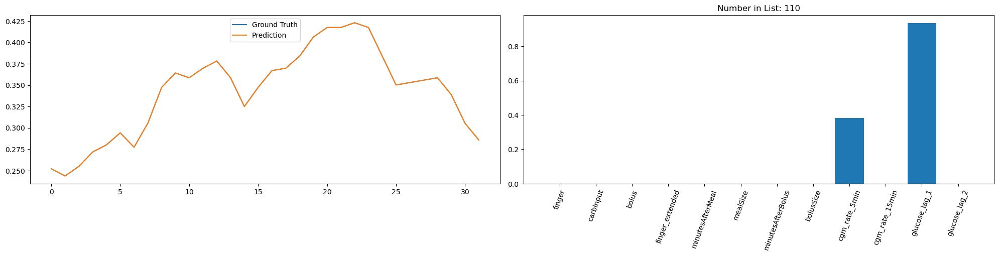

In [27]:
coef = []
model = LinearRegression()
for i, data in enumerate(train_set_list):
    plt.figure()
    coef.append(train_model(model, data, i))

[ 1.13395808e-16 -5.32870716e-18  4.16796915e-18  2.10420613e-16
 -9.69989842e-04  1.72197692e-03  9.69989842e-04 -1.69506867e-06
  3.80952381e-01  4.53165831e-17  9.34829835e-01  1.42699098e-16]


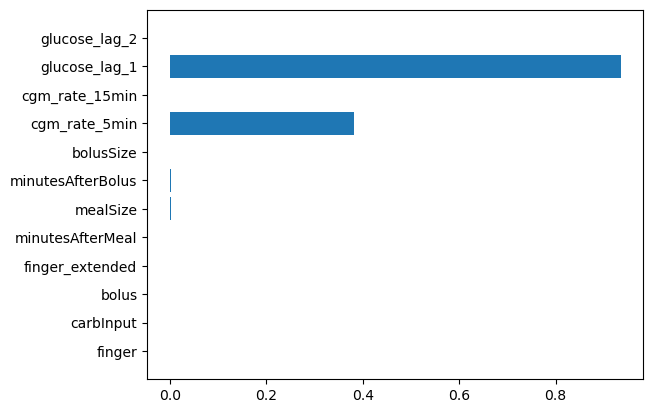

In [28]:
## Create ensemble linear regression model
totCoef = 0
for x in coef:
    if np.sum(np.abs(x)) > 1e3:
        print(x)
        continue
    totCoef += x

averageCoef = totCoef / len(coef)
print(averageCoef)
plt.barh(train_set_list[0].drop("cbg", axis=1).columns.values, averageCoef)
plt.show()

/opt/homebrew/Caskroom/miniforge/base/envs/py312/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/py312/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/py312/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/py312/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/py312/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have vali

<Figure size 640x480 with 0 Axes>

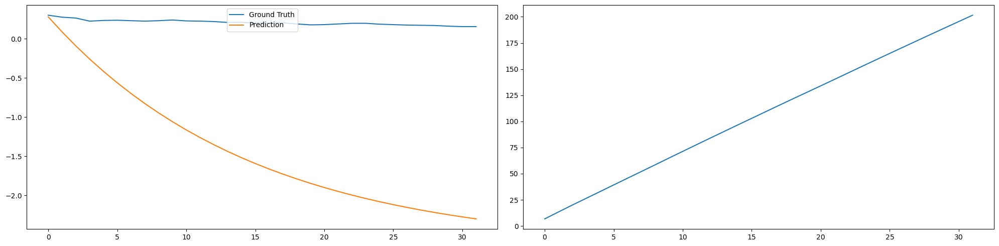

<Figure size 640x480 with 0 Axes>

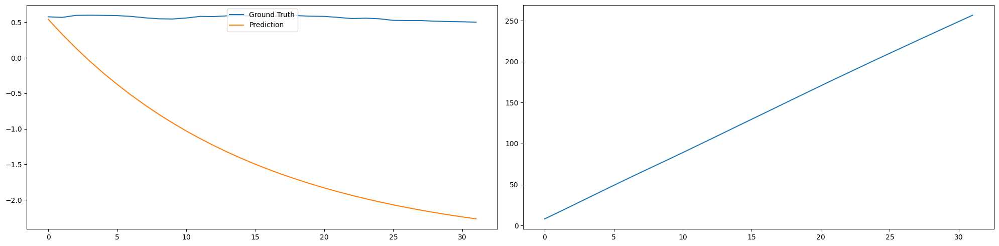

<Figure size 640x480 with 0 Axes>

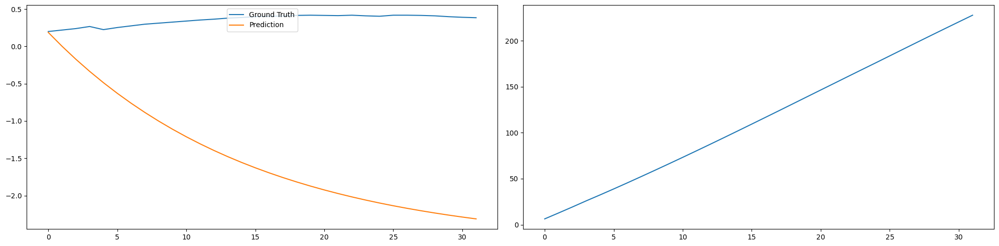

<Figure size 640x480 with 0 Axes>

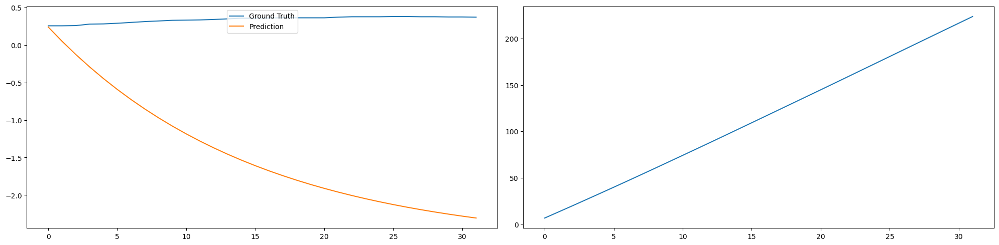

<Figure size 640x480 with 0 Axes>

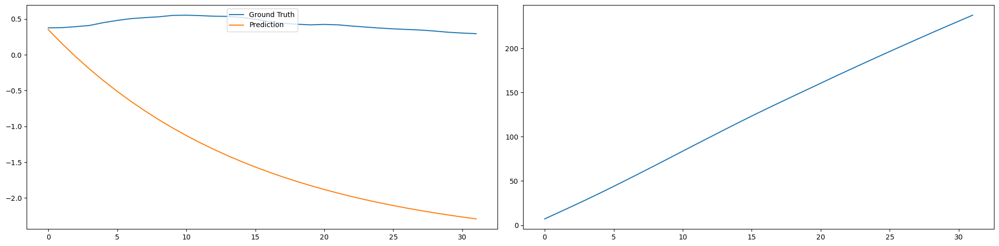

<Figure size 640x480 with 0 Axes>

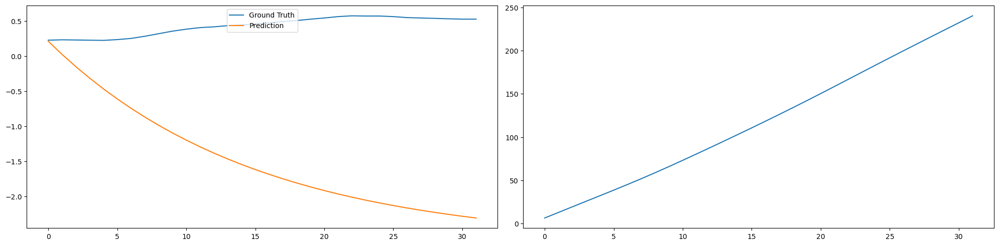

<Figure size 640x480 with 0 Axes>

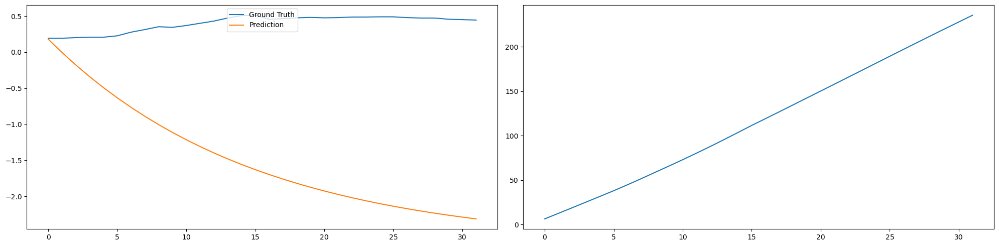

<Figure size 640x480 with 0 Axes>

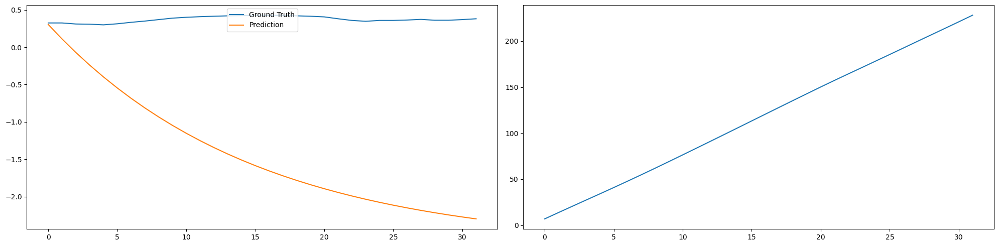

<Figure size 640x480 with 0 Axes>

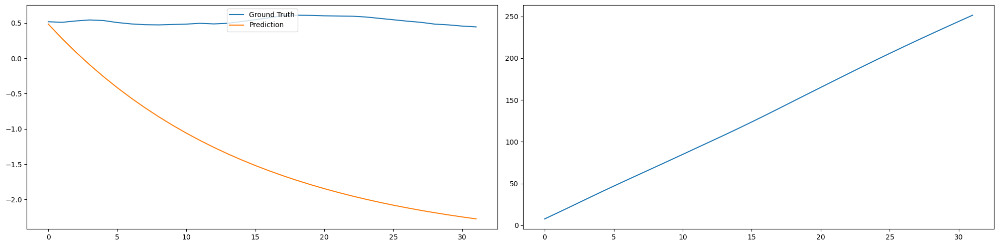

<Figure size 640x480 with 0 Axes>

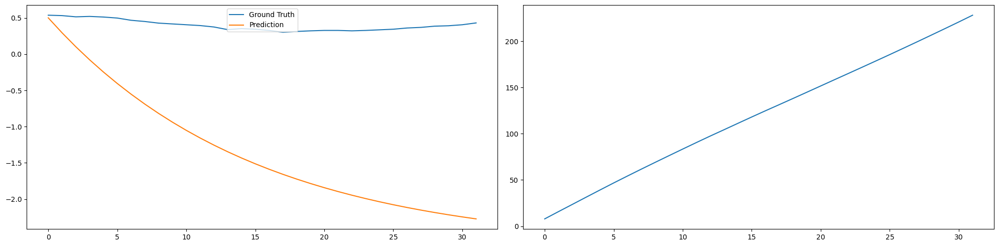

<Figure size 640x480 with 0 Axes>

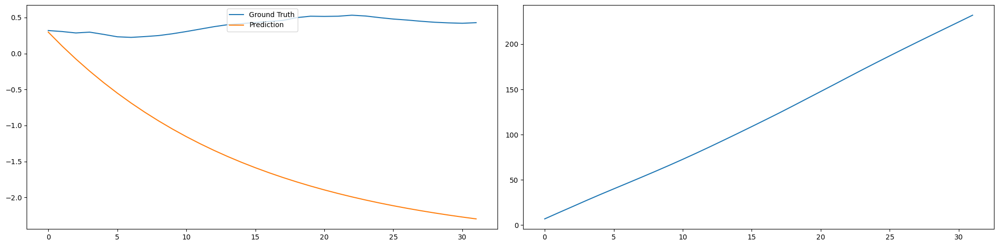

<Figure size 640x480 with 0 Axes>

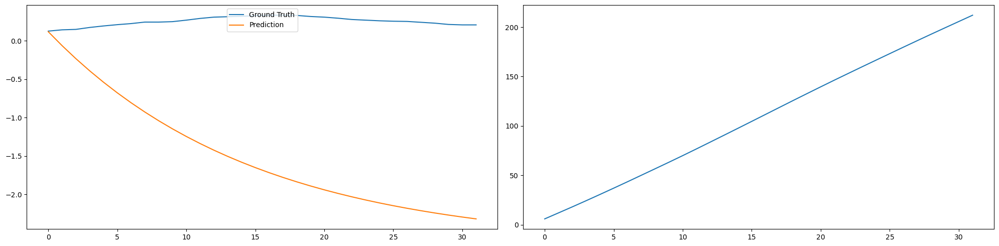

<Figure size 640x480 with 0 Axes>

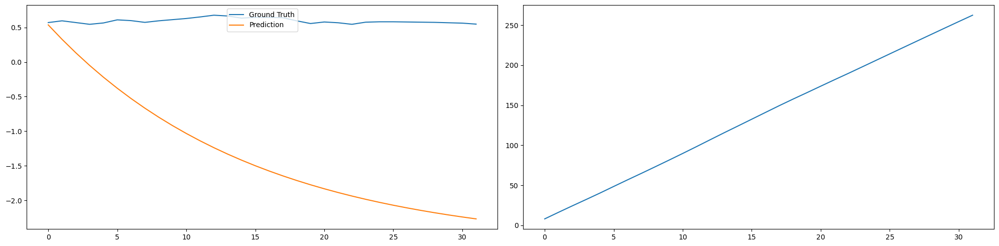

<Figure size 640x480 with 0 Axes>

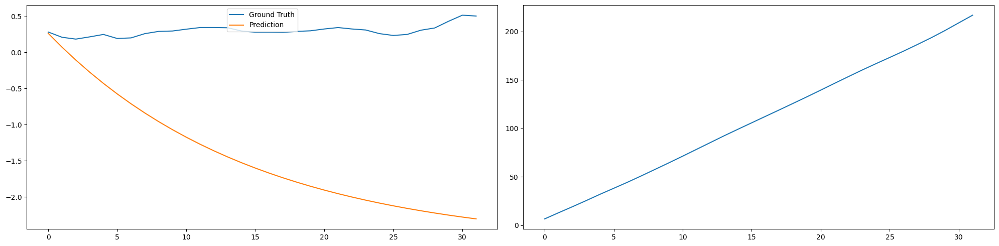

In [29]:
ensemble_model = LinearRegression()
ensemble_model.coef_ = averageCoef
for data in test_set_list:
    plt.figure()
    test_model(model, data, scaler)
    